In [1]:
from os.path import abspath, join, pardir
from bids  import BIDSLayout
from nipype.pipeline import Node, MapNode, Workflow
from nipype.interfaces.utility import Function, IdentityInterface
datadir = abspath("../data")

layout = BIDSLayout(datadir)

experiment_dir = abspath("../output")
output_dir = 'datasink'
working_dir = 'workingdir'

In [2]:
import nipype.algorithms.modelgen as model   # model generation
from  nipype.interfaces import fsl, spm     
from nipype.interfaces.base import Bunch
import os,json,glob,sys
import numpy
import nibabel
import nilearn.plotting
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt


    
results_dir = os.path.abspath("../results")
if not os.path.exists(results_dir):
    os.mkdir(results_dir)

from nipype.caching import Memory
mem = Memory(base_dir='.')

print('Using data from',datadir)

Using data from /Users/dima/Desktop/odormixture/data


/Users/dima/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


# ABCD 

In [3]:
copes_ABCD = {}
sublist1 = ['03', '04']
sublist2 = ['05', '06', '07']
sublist3 = ['09', '10', '11', '12']
sublist4 = ['13', '15', '16']
sublist5 = ['17', '18', '19', '20']
sublist6 = ['21', '23', '24']
sublist7 = ['25', '26', '27']
sublist8 = ['29', '30']
for subject_id in sublist1:
    for run_id in ['1', '2']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['AB',
                          'CD',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'AB'].onset),
                      list(events[events.trial_type == 'CD'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'AB'].duration),
                          list(events[events.trial_type == 'CD'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        AB_plus_CD = ['AB_plus_CD', 'T', [u'AB', u'CD', u'OFF'], [0,5, 0,5, -1]]
        AB_minus_CD = ['AB_minus_CD', 'T', [u'AB', u'CD', u'OFF'], [1, -1, 0]]
        CD_minus_AB = ['CD_minus_AB', 'T', [u'AB', u'CD', u'OFF'], [-1, 1, 0]]
        AB_minus_OFF = ['AB_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [1, 0, -1]]
        CD_minus_OFF = ['CD_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [0, 1, -1]]

        contrasts = [AB_plus_CD, AB_minus_CD, CD_minus_AB, AB_minus_OFF, CD_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLAB_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        
        
        copes_ABCD[subject_id] = list(estimatecontrasts.outputs.con_images)
        


for subject_id in sublist2:
    for run_id in ['1', '2']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['AB',
                          'CD',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'AB'].onset),
                      list(events[events.trial_type == 'CD'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'AB'].duration),
                          list(events[events.trial_type == 'CD'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        AB_plus_CD = ['AB_plus_CD', 'T', [u'AB', u'CD', u'OFF'], [0,5, 0,5, -1]]
        AB_minus_CD = ['AB_minus_CD', 'T', [u'AB', u'CD', u'OFF'], [1, -1, 0]]
        CD_minus_AB = ['CD_minus_AB', 'T', [u'AB', u'CD', u'OFF'], [-1, 1, 0]]
        AB_minus_OFF = ['AB_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [1, 0, -1]]
        CD_minus_OFF = ['CD_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [0, 1, -1]]

        contrasts = [AB_plus_CD, AB_minus_CD, CD_minus_AB, AB_minus_OFF, CD_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLAB_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_ABCD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
for subject_id in sublist3:
    for run_id in ['1', '2']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['AB',
                          'CD',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'AB'].onset),
                      list(events[events.trial_type == 'CD'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'AB'].duration),
                          list(events[events.trial_type == 'CD'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        AB_plus_CD = ['AB_plus_CD', 'T', [u'AB', u'CD', u'OFF'], [0,5, 0,5, -1]]
        AB_minus_CD = ['AB_minus_CD', 'T', [u'AB', u'CD', u'OFF'], [1, -1, 0]]
        CD_minus_AB = ['CD_minus_AB', 'T', [u'AB', u'CD', u'OFF'], [-1, 1, 0]]
        AB_minus_OFF = ['AB_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [1, 0, -1]]
        CD_minus_OFF = ['CD_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [0, 1, -1]]

        contrasts = [AB_plus_CD, AB_minus_CD, CD_minus_AB, AB_minus_OFF, CD_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLAB_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_ABCD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
for subject_id in sublist4:
    for run_id in ['1', '2']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['AB',
                          'CD',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'AB'].onset),
                      list(events[events.trial_type == 'CD'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'AB'].duration),
                          list(events[events.trial_type == 'CD'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        AB_plus_CD = ['AB_plus_CD', 'T', [u'AB', u'CD', u'OFF'], [0,5, 0,5, -1]]
        AB_minus_CD = ['AB_minus_CD', 'T', [u'AB', u'CD', u'OFF'], [1, -1, 0]]
        CD_minus_AB = ['CD_minus_AB', 'T', [u'AB', u'CD', u'OFF'], [-1, 1, 0]]
        AB_minus_OFF = ['AB_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [1, 0, -1]]
        CD_minus_OFF = ['CD_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [0, 1, -1]]

        contrasts = [AB_plus_CD, AB_minus_CD, CD_minus_AB, AB_minus_OFF, CD_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLAB_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_ABCD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist5:
    for run_id in ['5', '6']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['AB',
                          'CD',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'AB'].onset),
                      list(events[events.trial_type == 'CD'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'AB'].duration),
                          list(events[events.trial_type == 'CD'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        AB_plus_CD = ['AB_plus_CD', 'T', [u'AB', u'CD', u'OFF'], [0,5, 0,5, -1]]
        AB_minus_CD = ['AB_minus_CD', 'T', [u'AB', u'CD', u'OFF'], [1, -1, 0]]
        CD_minus_AB = ['CD_minus_AB', 'T', [u'AB', u'CD', u'OFF'], [-1, 1, 0]]
        AB_minus_OFF = ['AB_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [1, 0, -1]]
        CD_minus_OFF = ['CD_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [0, 1, -1]]

        contrasts = [AB_plus_CD, AB_minus_CD, CD_minus_AB, AB_minus_OFF, CD_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLAB_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_ABCD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist6:
    for run_id in ['5', '6']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['AB',
                          'CD',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'AB'].onset),
                      list(events[events.trial_type == 'CD'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'AB'].duration),
                          list(events[events.trial_type == 'CD'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        AB_plus_CD = ['AB_plus_CD', 'T', [u'AB', u'CD', u'OFF'], [0,5, 0,5, -1]]
        AB_minus_CD = ['AB_minus_CD', 'T', [u'AB', u'CD', u'OFF'], [1, -1, 0]]
        CD_minus_AB = ['CD_minus_AB', 'T', [u'AB', u'CD', u'OFF'], [-1, 1, 0]]
        AB_minus_OFF = ['AB_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [1, 0, -1]]
        CD_minus_OFF = ['CD_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [0, 1, -1]]

        contrasts = [AB_plus_CD, AB_minus_CD, CD_minus_AB, AB_minus_OFF, CD_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLAB_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_ABCD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist7:
    for run_id in ['5', '6']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['AB',
                          'CD',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'AB'].onset),
                      list(events[events.trial_type == 'CD'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'AB'].duration),
                          list(events[events.trial_type == 'CD'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        AB_plus_CD = ['AB_plus_CD', 'T', [u'AB', u'CD', u'OFF'], [0,5, 0,5, -1]]
        AB_minus_CD = ['AB_minus_CD', 'T', [u'AB', u'CD', u'OFF'], [1, -1, 0]]
        CD_minus_AB = ['CD_minus_AB', 'T', [u'AB', u'CD', u'OFF'], [-1, 1, 0]]
        AB_minus_OFF = ['AB_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [1, 0, -1]]
        CD_minus_OFF = ['CD_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [0, 1, -1]]

        contrasts = [AB_plus_CD, AB_minus_CD, CD_minus_AB, AB_minus_OFF, CD_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLAB_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_ABCD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist8:
    for run_id in ['5', '6']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['AB',
                          'CD',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'AB'].onset),
                      list(events[events.trial_type == 'CD'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'AB'].duration),
                          list(events[events.trial_type == 'CD'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        AB_plus_CD = ['AB_plus_CD', 'T', [u'AB', u'CD', u'OFF'], [0,5, 0,5, -1]]
        AB_minus_CD = ['AB_minus_CD', 'T', [u'AB', u'CD', u'OFF'], [1, -1, 0]]
        CD_minus_AB = ['CD_minus_AB', 'T', [u'AB', u'CD', u'OFF'], [-1, 1, 0]]
        AB_minus_OFF = ['AB_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [1, 0, -1]]
        CD_minus_OFF = ['CD_minus_OFF', 'T', [u'AB', u'CD', u'OFF'], [0, 1, -1]]

        contrasts = [AB_plus_CD, AB_minus_CD, CD_minus_AB, AB_minus_OFF, CD_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLAB_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_ABCD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
                                      
              
        
        



190208-14:36:06,535 nipype.workflow INFO:
	 [Node] Setting-up "1c1f8ebbdd32ad27f5772616bcee3210" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/1c1f8ebbdd32ad27f5772616bcee3210".
190208-14:36:06,544 nipype.workflow INFO:
	 [Node] Running "1c1f8ebbdd32ad27f5772616bcee3210" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-03/func/sub-03_task-odormixture_run-01_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/1c1f8ebbdd32ad27f5772616bcee3210/sub-03_task-odormixture_run-01_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-14:36:13,204 nipype.workflow INFO:
	 [Node] Finished "1c1f8ebbdd32ad27f5772616bcee3210".
190208-14:36:13,232 nipype.workflow INFO:
	 [Node] Setting-up "86cdc77d7d067b74e037b89050141d84" in "/Users/dima/Desktop/odormixture/jupyter/n

/Users/dima/anaconda3/lib/python3.7/site-packages/nipype/pipeline/engine/utils.py:307: DeprecationWarning: use "HasTraits.trait_set" instead
  result.outputs.set(**modify_paths(tosave, relative=True, basedir=cwd))
/Users/dima/anaconda3/lib/python3.7/site-packages/nipype/interfaces/base/traits_extension.py:326: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  value, collections.Sequence):


190208-14:37:11,317 nipype.workflow INFO:
	 [Node] Finished "86cdc77d7d067b74e037b89050141d84".
190208-14:37:11,334 nipype.workflow INFO:
	 [Node] Setting-up "c4de4c6c42b4a4cde6ee08c55ea01b42" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/c4de4c6c42b4a4cde6ee08c55ea01b42".
190208-14:37:11,344 nipype.workflow INFO:
	 [Node] Running "c4de4c6c42b4a4cde6ee08c55ea01b42" ("nipype.interfaces.spm.model.EstimateModel")
190208-14:37:58,968 nipype.workflow INFO:
	 [Node] Finished "c4de4c6c42b4a4cde6ee08c55ea01b42".
190208-14:37:58,981 nipype.workflow INFO:
	 [Node] Setting-up "fc097d2d58b3a5d70c695f4581e32081" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/fc097d2d58b3a5d70c695f4581e32081".
190208-14:37:58,997 nipype.workflow INFO:
	 [Node] Running "fc097d2d58b3a5d70c695f4581e32081" ("nipype.interfaces.spm.model.EstimateContrast")
190208-14:38:32,475 nipype.workflow INFO:
	 [Node] Finished "fc0

190208-14:44:28,576 nipype.workflow INFO:
	 [Node] Finished "7ecb8d522c671b5bbe34705935675285".
190208-14:44:28,595 nipype.workflow INFO:
	 [Node] Setting-up "6aae7b51f2c3458cb8351df5e3ae998c" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/6aae7b51f2c3458cb8351df5e3ae998c".
190208-14:44:28,622 nipype.workflow INFO:
	 [Node] Running "6aae7b51f2c3458cb8351df5e3ae998c" ("nipype.interfaces.spm.model.Level1Design")
190208-14:45:00,181 nipype.workflow INFO:
	 [Node] Finished "6aae7b51f2c3458cb8351df5e3ae998c".
190208-14:45:00,188 nipype.workflow INFO:
	 [Node] Setting-up "656abc69508e39c9011af0228ee02de6" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/656abc69508e39c9011af0228ee02de6".
190208-14:45:00,197 nipype.workflow INFO:
	 [Node] Running "656abc69508e39c9011af0228ee02de6" ("nipype.interfaces.spm.model.EstimateModel")
190208-14:45:37,9 nipype.workflow INFO:
	 [Node] Finished "656abc69508e3

190208-14:51:40,21 nipype.workflow INFO:
	 [Node] Setting-up "6574d2fc88dbe48bf0d22195f40f63ad" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/6574d2fc88dbe48bf0d22195f40f63ad".
190208-14:51:40,30 nipype.workflow INFO:
	 [Node] Running "6574d2fc88dbe48bf0d22195f40f63ad" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-07/func/sub-07_task-odormixture_run-01_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/6574d2fc88dbe48bf0d22195f40f63ad/sub-07_task-odormixture_run-01_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-14:51:44,958 nipype.workflow INFO:
	 [Node] Finished "6574d2fc88dbe48bf0d22195f40f63ad".
190208-14:51:44,982 nipype.workflow INFO:
	 [Node] Setting-up "ced6daae3baced06f70c158249e120da" in "/Users/dima/Desktop/odormixture/jupyter/nip

190208-14:58:25,864 nipype.workflow INFO:
	 [Node] Running "8b92da2247b630a439bdcf64a714db0c" ("nipype.interfaces.spm.model.EstimateModel")
190208-14:59:07,858 nipype.workflow INFO:
	 [Node] Finished "8b92da2247b630a439bdcf64a714db0c".
190208-14:59:07,870 nipype.workflow INFO:
	 [Node] Setting-up "111f67ef1ab46224bd151864367985f2" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/111f67ef1ab46224bd151864367985f2".
190208-14:59:07,886 nipype.workflow INFO:
	 [Node] Running "111f67ef1ab46224bd151864367985f2" ("nipype.interfaces.spm.model.EstimateContrast")
190208-14:59:39,523 nipype.workflow INFO:
	 [Node] Finished "111f67ef1ab46224bd151864367985f2".
190208-14:59:39,593 nipype.workflow INFO:
	 [Node] Setting-up "dd24dc2874bf433fc276bb53e3a28955" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/dd24dc2874bf433fc276bb53e3a28955".
190208-14:59:39,598 nipype.workflow INFO:
	 [Node] Running "dd24dc2

190208-15:05:35,190 nipype.workflow INFO:
	 [Node] Finished "7be07323a15bb9fc5734168be7aa409f".
190208-15:05:35,206 nipype.workflow INFO:
	 [Node] Setting-up "db39d098b7786e3186ed981dfba38039" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/db39d098b7786e3186ed981dfba38039".
190208-15:05:35,234 nipype.workflow INFO:
	 [Node] Running "db39d098b7786e3186ed981dfba38039" ("nipype.interfaces.spm.model.Level1Design")
190208-15:06:07,989 nipype.workflow INFO:
	 [Node] Finished "db39d098b7786e3186ed981dfba38039".
190208-15:06:07,996 nipype.workflow INFO:
	 [Node] Setting-up "57824b6b9a27be41d66a82bb4f90a436" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/57824b6b9a27be41d66a82bb4f90a436".
190208-15:06:08,3 nipype.workflow INFO:
	 [Node] Running "57824b6b9a27be41d66a82bb4f90a436" ("nipype.interfaces.spm.model.EstimateModel")
190208-15:06:51,247 nipype.workflow INFO:
	 [Node] Finished "57824b6b9a27b

190208-15:12:56,881 nipype.workflow INFO:
	 [Node] Setting-up "c5efb73f4fbb3aab74910515f257892b" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/c5efb73f4fbb3aab74910515f257892b".
190208-15:12:56,888 nipype.workflow INFO:
	 [Node] Running "c5efb73f4fbb3aab74910515f257892b" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-13/func/sub-13_task-odormixture_run-02_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/c5efb73f4fbb3aab74910515f257892b/sub-13_task-odormixture_run-02_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-15:13:00,792 nipype.workflow INFO:
	 [Node] Finished "c5efb73f4fbb3aab74910515f257892b".
190208-15:13:00,808 nipype.workflow INFO:
	 [Node] Setting-up "69b30aa4074df5ae97908eaefc1d9592" in "/Users/dima/Desktop/odormixture/jupyter/n

190208-15:18:43,249 nipype.workflow INFO:
	 [Node] Running "d03c98301111e72780616ab8abd825e2" ("nipype.interfaces.spm.model.EstimateModel")
190208-15:19:24,724 nipype.workflow INFO:
	 [Node] Finished "d03c98301111e72780616ab8abd825e2".
190208-15:19:24,737 nipype.workflow INFO:
	 [Node] Setting-up "2bdd9ba05435f41e4b2ada5aa4c75db4" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/2bdd9ba05435f41e4b2ada5aa4c75db4".
190208-15:19:24,754 nipype.workflow INFO:
	 [Node] Running "2bdd9ba05435f41e4b2ada5aa4c75db4" ("nipype.interfaces.spm.model.EstimateContrast")
190208-15:19:56,500 nipype.workflow INFO:
	 [Node] Finished "2bdd9ba05435f41e4b2ada5aa4c75db4".
190208-15:19:56,563 nipype.workflow INFO:
	 [Node] Setting-up "ad1fdf862702f05554a826abee99dccd" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/ad1fdf862702f05554a826abee99dccd".
190208-15:19:56,569 nipype.workflow INFO:
	 [Node] Running "ad1fdf8

190208-15:26:02,140 nipype.workflow INFO:
	 [Node] Finished "ef68e465756b5cd5d8201ccecb80476d".
190208-15:26:02,177 nipype.workflow INFO:
	 [Node] Setting-up "566c5bcb9c4c69724524dec99572d523" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/566c5bcb9c4c69724524dec99572d523".
190208-15:26:02,232 nipype.workflow INFO:
	 [Node] Running "566c5bcb9c4c69724524dec99572d523" ("nipype.interfaces.spm.model.Level1Design")
190208-15:26:42,596 nipype.workflow INFO:
	 [Node] Finished "566c5bcb9c4c69724524dec99572d523".
190208-15:26:42,606 nipype.workflow INFO:
	 [Node] Setting-up "2ff9dc9b712414acc15349697c0dbe17" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/2ff9dc9b712414acc15349697c0dbe17".
190208-15:26:42,615 nipype.workflow INFO:
	 [Node] Running "2ff9dc9b712414acc15349697c0dbe17" ("nipype.interfaces.spm.model.EstimateModel")
190208-15:27:24,542 nipype.workflow INFO:
	 [Node] Finished "2ff9dc9b712

190208-15:33:43,426 nipype.workflow INFO:
	 [Node] Setting-up "642ffcc72199f7a7765850f1c4be268f" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/642ffcc72199f7a7765850f1c4be268f".
190208-15:33:43,432 nipype.workflow INFO:
	 [Node] Running "642ffcc72199f7a7765850f1c4be268f" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-20/func/sub-20_task-odormixture_run-05_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/642ffcc72199f7a7765850f1c4be268f/sub-20_task-odormixture_run-05_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-15:33:47,493 nipype.workflow INFO:
	 [Node] Finished "642ffcc72199f7a7765850f1c4be268f".
190208-15:33:47,512 nipype.workflow INFO:
	 [Node] Setting-up "884485f301aaf557f9ec0e5c448b66c9" in "/Users/dima/Desktop/odormixture/jupyter/n

190208-15:39:52,644 nipype.workflow INFO:
	 [Node] Running "329494f731d41c042f6fb11e88df39be" ("nipype.interfaces.spm.model.EstimateModel")
190208-15:40:34,355 nipype.workflow INFO:
	 [Node] Finished "329494f731d41c042f6fb11e88df39be".
190208-15:40:34,366 nipype.workflow INFO:
	 [Node] Setting-up "703253053c685172b1d2c58877d5b9f1" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/703253053c685172b1d2c58877d5b9f1".
190208-15:40:34,386 nipype.workflow INFO:
	 [Node] Running "703253053c685172b1d2c58877d5b9f1" ("nipype.interfaces.spm.model.EstimateContrast")
190208-15:41:05,10 nipype.workflow INFO:
	 [Node] Finished "703253053c685172b1d2c58877d5b9f1".
190208-15:41:05,69 nipype.workflow INFO:
	 [Node] Setting-up "fe01789d3884017ddf0daf1872345221" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/fe01789d3884017ddf0daf1872345221".
190208-15:41:05,75 nipype.workflow INFO:
	 [Node] Running "fe01789d38

190208-15:46:45,197 nipype.workflow INFO:
	 [Node] Finished "35b5b541de0a68f610846a4a74aabb86".
190208-15:46:45,221 nipype.workflow INFO:
	 [Node] Setting-up "f968ac74ae9e02c54539dfc2bc8c685a" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/f968ac74ae9e02c54539dfc2bc8c685a".
190208-15:46:45,255 nipype.workflow INFO:
	 [Node] Running "f968ac74ae9e02c54539dfc2bc8c685a" ("nipype.interfaces.spm.model.Level1Design")
190208-15:47:18,484 nipype.workflow INFO:
	 [Node] Finished "f968ac74ae9e02c54539dfc2bc8c685a".
190208-15:47:18,492 nipype.workflow INFO:
	 [Node] Setting-up "17073db266d12263b7d28f4278c8b8a1" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/17073db266d12263b7d28f4278c8b8a1".
190208-15:47:18,499 nipype.workflow INFO:
	 [Node] Running "17073db266d12263b7d28f4278c8b8a1" ("nipype.interfaces.spm.model.EstimateModel")
190208-15:48:02,604 nipype.workflow INFO:
	 [Node] Finished "17073db266d

190208-15:54:18,97 nipype.workflow INFO:
	 [Node] Setting-up "9089d31f924d7aa9dd0940618442839c" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/9089d31f924d7aa9dd0940618442839c".
190208-15:54:18,102 nipype.workflow INFO:
	 [Node] Running "9089d31f924d7aa9dd0940618442839c" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-26/func/sub-26_task-odormixture_run-06_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/9089d31f924d7aa9dd0940618442839c/sub-26_task-odormixture_run-06_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-15:54:22,875 nipype.workflow INFO:
	 [Node] Finished "9089d31f924d7aa9dd0940618442839c".
190208-15:54:22,895 nipype.workflow INFO:
	 [Node] Setting-up "a9da51c76332299f030eedaa819bfd04" in "/Users/dima/Desktop/odormixture/jupyter/ni

190208-16:00:47,189 nipype.workflow INFO:
	 [Node] Running "9e89ba5be289a469d8d188de40acb396" ("nipype.interfaces.spm.model.EstimateModel")
190208-16:01:29,597 nipype.workflow INFO:
	 [Node] Finished "9e89ba5be289a469d8d188de40acb396".
190208-16:01:29,611 nipype.workflow INFO:
	 [Node] Setting-up "3ea6f2024937f17fc4796e30629a899d" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/3ea6f2024937f17fc4796e30629a899d".
190208-16:01:29,627 nipype.workflow INFO:
	 [Node] Running "3ea6f2024937f17fc4796e30629a899d" ("nipype.interfaces.spm.model.EstimateContrast")
190208-16:02:05,193 nipype.workflow INFO:
	 [Node] Finished "3ea6f2024937f17fc4796e30629a899d".
190208-16:02:05,263 nipype.workflow INFO:
	 [Node] Setting-up "a7e6e818a39bd1bb1e11323b2b8a18dd" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/a7e6e818a39bd1bb1e11323b2b8a18dd".
190208-16:02:05,270 nipype.workflow INFO:
	 [Node] Running "a7e6e81

# AB

In [4]:
copes_AB = {}
sublist1 = ['03', '04']
sublist2 = ['05', '06', '07']
sublist3 = ['09', '10', '11', '12']
sublist4 = ['13', '15', '16']
sublist5 = ['17', '18', '19', '20']
sublist6 = ['21', '23', '24']
sublist7 = ['25', '26', '27']
sublist8 = ['29', '30']
for subject_id in sublist1:
    for run_id in ['3', '5']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['A',
                          'B',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'A'].onset),
                      list(events[events.trial_type == 'B'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'A'].duration),
                          list(events[events.trial_type == 'B'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        A_plus_B = ['A_plus_B', 'T', [u'A', u'B', u'OFF'], [0,5, 0,5, -1]]
        A_minus_B = ['A_minus_B', 'T', [u'A', u'B', u'OFF'], [1, -1, 0]]
        B_minus_A = ['B_minus_A', 'T', [u'A', u'B', u'OFF'], [-1, 1, 0]]
        A_minus_OFF = ['A_minus_OFF', 'T', [u'A', u'B', u'OFF'], [1, 0, -1]]
        B_minus_OFF = ['B_minus_OFF', 'T', [u'A', u'B', u'OFF'], [0, 1, -1]]

        contrasts = [A_plus_B, A_minus_B, B_minus_A, A_minus_OFF, B_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLA_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        
        
        copes_AB[subject_id] = list(estimatecontrasts.outputs.con_images)
        


for subject_id in sublist2:
    for run_id in ['3', '5']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['A',
                          'B',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'A'].onset),
                      list(events[events.trial_type == 'B'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'A'].duration),
                          list(events[events.trial_type == 'B'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        A_plus_B = ['A_plus_B', 'T', [u'A', u'B', u'OFF'], [0,5, 0,5, -1]]
        A_minus_B = ['A_minus_B', 'T', [u'A', u'B', u'OFF'], [1, -1, 0]]
        B_minus_A = ['B_minus_A', 'T', [u'A', u'B', u'OFF'], [-1, 1, 0]]
        A_minus_OFF = ['A_minus_OFF', 'T', [u'A', u'B', u'OFF'], [1, 0, -1]]
        B_minus_OFF = ['B_minus_OFF', 'T', [u'A', u'B', u'OFF'], [0, 1, -1]]

        contrasts = [A_plus_B, A_minus_B, B_minus_A, A_minus_OFF, B_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLA_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_AB[subject_id] = list(estimatecontrasts.outputs.con_images)
        
for subject_id in sublist3:
    for run_id in ['4', '6']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['A',
                          'B',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'A'].onset),
                      list(events[events.trial_type == 'B'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'A'].duration),
                          list(events[events.trial_type == 'B'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        A_plus_B = ['A_plus_B', 'T', [u'A', u'B', u'OFF'], [0,5, 0,5, -1]]
        A_minus_B = ['A_minus_B', 'T', [u'A', u'B', u'OFF'], [1, -1, 0]]
        B_minus_A = ['B_minus_A', 'T', [u'A', u'B', u'OFF'], [-1, 1, 0]]
        A_minus_OFF = ['A_minus_OFF', 'T', [u'A', u'B', u'OFF'], [1, 0, -1]]
        B_minus_OFF = ['B_minus_OFF', 'T', [u'A', u'B', u'OFF'], [0, 1, -1]]

        contrasts = [A_plus_B, A_minus_B, B_minus_A, A_minus_OFF, B_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLA_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_AB[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
for subject_id in sublist4:
    for run_id in ['4', '6']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['A',
                          'B',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'A'].onset),
                      list(events[events.trial_type == 'B'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'A'].duration),
                          list(events[events.trial_type == 'B'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        A_plus_B = ['A_plus_B', 'T', [u'A', u'B', u'OFF'], [0,5, 0,5, -1]]
        A_minus_B = ['A_minus_B', 'T', [u'A', u'B', u'OFF'], [1, -1, 0]]
        B_minus_A = ['B_minus_A', 'T', [u'A', u'B', u'OFF'], [-1, 1, 0]]
        A_minus_OFF = ['A_minus_OFF', 'T', [u'A', u'B', u'OFF'], [1, 0, -1]]
        B_minus_OFF = ['B_minus_OFF', 'T', [u'A', u'B', u'OFF'], [0, 1, -1]]

        contrasts = [A_plus_B, A_minus_B, B_minus_A, A_minus_OFF, B_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLA_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_AB[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist5:
    for run_id in ['1', '3']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['A',
                          'B',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'A'].onset),
                      list(events[events.trial_type == 'B'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'A'].duration),
                          list(events[events.trial_type == 'B'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        A_plus_B = ['A_plus_B', 'T', [u'A', u'B', u'OFF'], [0,5, 0,5, -1]]
        A_minus_B = ['A_minus_B', 'T', [u'A', u'B', u'OFF'], [1, -1, 0]]
        B_minus_A = ['B_minus_A', 'T', [u'A', u'B', u'OFF'], [-1, 1, 0]]
        A_minus_OFF = ['A_minus_OFF', 'T', [u'A', u'B', u'OFF'], [1, 0, -1]]
        B_minus_OFF = ['B_minus_OFF', 'T', [u'A', u'B', u'OFF'], [0, 1, -1]]

        contrasts = [A_plus_B, A_minus_B, B_minus_A, A_minus_OFF, B_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLA_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_AB[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist6:
    for run_id in ['1', '3']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['A',
                          'B',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'A'].onset),
                      list(events[events.trial_type == 'B'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'A'].duration),
                          list(events[events.trial_type == 'B'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        A_plus_B = ['A_plus_B', 'T', [u'A', u'B', u'OFF'], [0,5, 0,5, -1]]
        A_minus_B = ['A_minus_B', 'T', [u'A', u'B', u'OFF'], [1, -1, 0]]
        B_minus_A = ['B_minus_A', 'T', [u'A', u'B', u'OFF'], [-1, 1, 0]]
        A_minus_OFF = ['A_minus_OFF', 'T', [u'A', u'B', u'OFF'], [1, 0, -1]]
        B_minus_OFF = ['B_minus_OFF', 'T', [u'A', u'B', u'OFF'], [0, 1, -1]]

        contrasts = [A_plus_B, A_minus_B, B_minus_A, A_minus_OFF, B_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLA_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_AB[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist7:
    for run_id in ['2', '4']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['A',
                          'B',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'A'].onset),
                      list(events[events.trial_type == 'B'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'A'].duration),
                          list(events[events.trial_type == 'B'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        A_plus_B = ['A_plus_B', 'T', [u'A', u'B', u'OFF'], [0,5, 0,5, -1]]
        A_minus_B = ['A_minus_B', 'T', [u'A', u'B', u'OFF'], [1, -1, 0]]
        B_minus_A = ['B_minus_A', 'T', [u'A', u'B', u'OFF'], [-1, 1, 0]]
        A_minus_OFF = ['A_minus_OFF', 'T', [u'A', u'B', u'OFF'], [1, 0, -1]]
        B_minus_OFF = ['B_minus_OFF', 'T', [u'A', u'B', u'OFF'], [0, 1, -1]]

        contrasts = [A_plus_B, A_minus_B, B_minus_A, A_minus_OFF, B_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLA_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_AB[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist8:
    for run_id in ['2', '4']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['A',
                          'B',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'A'].onset),
                      list(events[events.trial_type == 'B'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'A'].duration),
                          list(events[events.trial_type == 'B'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        A_plus_B = ['A_plus_B', 'T', [u'A', u'B', u'OFF'], [0,5, 0,5, -1]]
        A_minus_B = ['A_minus_B', 'T', [u'A', u'B', u'OFF'], [1, -1, 0]]
        B_minus_A = ['B_minus_A', 'T', [u'A', u'B', u'OFF'], [-1, 1, 0]]
        A_minus_OFF = ['A_minus_OFF', 'T', [u'A', u'B', u'OFF'], [1, 0, -1]]
        B_minus_OFF = ['B_minus_OFF', 'T', [u'A', u'B', u'OFF'], [0, 1, -1]]

        contrasts = [A_plus_B, A_minus_B, B_minus_A, A_minus_OFF, B_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLA_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_AB[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
                                      
              
        
        



190208-16:07:35,695 nipype.workflow INFO:
	 [Node] Setting-up "802291e09f4143ed331b6b9d6d395079" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/802291e09f4143ed331b6b9d6d395079".
190208-16:07:35,704 nipype.workflow INFO:
	 [Node] Running "802291e09f4143ed331b6b9d6d395079" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-03/func/sub-03_task-odormixture_run-03_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/802291e09f4143ed331b6b9d6d395079/sub-03_task-odormixture_run-03_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-16:07:40,231 nipype.workflow INFO:
	 [Node] Finished "802291e09f4143ed331b6b9d6d395079".
190208-16:07:40,248 nipype.workflow INFO:
	 [Node] Setting-up "b7360800ef6536511cdce74625a2f82a" in "/Users/dima/Desktop/odormixture/jupyter/n

/Users/dima/anaconda3/lib/python3.7/site-packages/nipype/pipeline/engine/utils.py:307: DeprecationWarning: use "HasTraits.trait_set" instead
  result.outputs.set(**modify_paths(tosave, relative=True, basedir=cwd))


190208-16:08:14,945 nipype.workflow INFO:
	 [Node] Finished "b7360800ef6536511cdce74625a2f82a".
190208-16:08:14,954 nipype.workflow INFO:
	 [Node] Setting-up "1ec6292b54d89448a6c0aac05a90f01e" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/1ec6292b54d89448a6c0aac05a90f01e".
190208-16:08:14,961 nipype.workflow INFO:
	 [Node] Running "1ec6292b54d89448a6c0aac05a90f01e" ("nipype.interfaces.spm.model.EstimateModel")
190208-16:08:56,103 nipype.workflow INFO:
	 [Node] Finished "1ec6292b54d89448a6c0aac05a90f01e".
190208-16:08:56,116 nipype.workflow INFO:
	 [Node] Setting-up "b784ee1511a094aa9edd045b941fb6c3" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/b784ee1511a094aa9edd045b941fb6c3".
190208-16:08:56,135 nipype.workflow INFO:
	 [Node] Running "b784ee1511a094aa9edd045b941fb6c3" ("nipype.interfaces.spm.model.EstimateContrast")
190208-16:09:26,61 nipype.workflow INFO:
	 [Node] Finished "b784

190208-16:15:02,262 nipype.workflow INFO:
	 [Node] Finished "728a82f36cff4c6fdd13f89555887351".
190208-16:15:02,283 nipype.workflow INFO:
	 [Node] Setting-up "bb2eea7f73a2d85742cc42073a10ef60" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/bb2eea7f73a2d85742cc42073a10ef60".
190208-16:15:02,312 nipype.workflow INFO:
	 [Node] Running "bb2eea7f73a2d85742cc42073a10ef60" ("nipype.interfaces.spm.model.Level1Design")
190208-16:15:34,298 nipype.workflow INFO:
	 [Node] Finished "bb2eea7f73a2d85742cc42073a10ef60".
190208-16:15:34,307 nipype.workflow INFO:
	 [Node] Setting-up "6fd6b537a57d8c5933f2d4a4ab62782a" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/6fd6b537a57d8c5933f2d4a4ab62782a".
190208-16:15:34,316 nipype.workflow INFO:
	 [Node] Running "6fd6b537a57d8c5933f2d4a4ab62782a" ("nipype.interfaces.spm.model.EstimateModel")
190208-16:16:14,912 nipype.workflow INFO:
	 [Node] Finished "6fd6b537a57

190208-16:22:20,361 nipype.workflow INFO:
	 [Node] Setting-up "ff508324852fbe10eb4f1355588c8f6c" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/ff508324852fbe10eb4f1355588c8f6c".
190208-16:22:20,367 nipype.workflow INFO:
	 [Node] Running "ff508324852fbe10eb4f1355588c8f6c" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-07/func/sub-07_task-odormixture_run-03_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/ff508324852fbe10eb4f1355588c8f6c/sub-07_task-odormixture_run-03_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-16:22:25,401 nipype.workflow INFO:
	 [Node] Finished "ff508324852fbe10eb4f1355588c8f6c".
190208-16:22:25,423 nipype.workflow INFO:
	 [Node] Setting-up "c3fde63f99dc65aba09602f33aea65f7" in "/Users/dima/Desktop/odormixture/jupyter/n

190208-16:28:13,883 nipype.workflow INFO:
	 [Node] Running "4d74832fd00ccdede0c22f6a92c16ca9" ("nipype.interfaces.spm.model.EstimateModel")
190208-16:28:53,517 nipype.workflow INFO:
	 [Node] Finished "4d74832fd00ccdede0c22f6a92c16ca9".
190208-16:28:53,530 nipype.workflow INFO:
	 [Node] Setting-up "0fcb66cffbdfe26dd2512c9faa9509a2" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/0fcb66cffbdfe26dd2512c9faa9509a2".
190208-16:28:53,546 nipype.workflow INFO:
	 [Node] Running "0fcb66cffbdfe26dd2512c9faa9509a2" ("nipype.interfaces.spm.model.EstimateContrast")
190208-16:29:27,740 nipype.workflow INFO:
	 [Node] Finished "0fcb66cffbdfe26dd2512c9faa9509a2".
190208-16:29:27,804 nipype.workflow INFO:
	 [Node] Setting-up "a818a2b30e940de8ef25340bbf9cd95f" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/a818a2b30e940de8ef25340bbf9cd95f".
190208-16:29:27,810 nipype.workflow INFO:
	 [Node] Running "a818a2b

190208-16:35:11,618 nipype.workflow INFO:
	 [Node] Finished "3faaa1b97e2c3e55683eae10071eb99b".
190208-16:35:11,638 nipype.workflow INFO:
	 [Node] Setting-up "987542c7f1303bef1191814cd32c5023" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/987542c7f1303bef1191814cd32c5023".
190208-16:35:11,667 nipype.workflow INFO:
	 [Node] Running "987542c7f1303bef1191814cd32c5023" ("nipype.interfaces.spm.model.Level1Design")
190208-16:35:43,348 nipype.workflow INFO:
	 [Node] Finished "987542c7f1303bef1191814cd32c5023".
190208-16:35:43,356 nipype.workflow INFO:
	 [Node] Setting-up "703ec191a1ca6aaa42e956bd04476216" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/703ec191a1ca6aaa42e956bd04476216".
190208-16:35:43,365 nipype.workflow INFO:
	 [Node] Running "703ec191a1ca6aaa42e956bd04476216" ("nipype.interfaces.spm.model.EstimateModel")
190208-16:36:20,236 nipype.workflow INFO:
	 [Node] Finished "703ec191a1c

190208-16:42:25,438 nipype.workflow INFO:
	 [Node] Setting-up "8b5217a046db13336dbed038e2f0f3ef" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/8b5217a046db13336dbed038e2f0f3ef".
190208-16:42:25,445 nipype.workflow INFO:
	 [Node] Running "8b5217a046db13336dbed038e2f0f3ef" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-13/func/sub-13_task-odormixture_run-06_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/8b5217a046db13336dbed038e2f0f3ef/sub-13_task-odormixture_run-06_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-16:42:29,366 nipype.workflow INFO:
	 [Node] Finished "8b5217a046db13336dbed038e2f0f3ef".
190208-16:42:29,383 nipype.workflow INFO:
	 [Node] Setting-up "f1ce4ed90bdc762749cadc32c7bb2dc4" in "/Users/dima/Desktop/odormixture/jupyter/n

190208-16:48:29,513 nipype.workflow INFO:
	 [Node] Running "af07cd400fbdf3cbd71aeaeed190b83a" ("nipype.interfaces.spm.model.EstimateModel")
190208-16:49:24,288 nipype.workflow INFO:
	 [Node] Finished "af07cd400fbdf3cbd71aeaeed190b83a".
190208-16:49:24,302 nipype.workflow INFO:
	 [Node] Setting-up "d0c58f1335af68bc700eff5f284f42fa" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/d0c58f1335af68bc700eff5f284f42fa".
190208-16:49:24,318 nipype.workflow INFO:
	 [Node] Running "d0c58f1335af68bc700eff5f284f42fa" ("nipype.interfaces.spm.model.EstimateContrast")
190208-16:50:00,787 nipype.workflow INFO:
	 [Node] Finished "d0c58f1335af68bc700eff5f284f42fa".
190208-16:50:00,844 nipype.workflow INFO:
	 [Node] Setting-up "f07b414365b6fefa023fd291c2e2e4f4" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/f07b414365b6fefa023fd291c2e2e4f4".
190208-16:50:00,850 nipype.workflow INFO:
	 [Node] Running "f07b414

190208-16:55:37,199 nipype.workflow INFO:
	 [Node] Finished "8eedc7ad7c7ef8eb517bf727f3445a65".
190208-16:55:37,219 nipype.workflow INFO:
	 [Node] Setting-up "3bcb67fd7b20879897ed3a67144e6a4a" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/3bcb67fd7b20879897ed3a67144e6a4a".
190208-16:55:37,245 nipype.workflow INFO:
	 [Node] Running "3bcb67fd7b20879897ed3a67144e6a4a" ("nipype.interfaces.spm.model.Level1Design")
190208-16:56:13,141 nipype.workflow INFO:
	 [Node] Finished "3bcb67fd7b20879897ed3a67144e6a4a".
190208-16:56:13,150 nipype.workflow INFO:
	 [Node] Setting-up "0e5fec9026ce347f7211ae9b47e56ba5" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/0e5fec9026ce347f7211ae9b47e56ba5".
190208-16:56:13,158 nipype.workflow INFO:
	 [Node] Running "0e5fec9026ce347f7211ae9b47e56ba5" ("nipype.interfaces.spm.model.EstimateModel")
190208-16:56:59,613 nipype.workflow INFO:
	 [Node] Finished "0e5fec9026c

190208-17:03:41,385 nipype.workflow INFO:
	 [Node] Setting-up "b209c87c247dae4df8233b366f98f945" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/b209c87c247dae4df8233b366f98f945".
190208-17:03:41,391 nipype.workflow INFO:
	 [Node] Running "b209c87c247dae4df8233b366f98f945" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-20/func/sub-20_task-odormixture_run-01_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/b209c87c247dae4df8233b366f98f945/sub-20_task-odormixture_run-01_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-17:03:46,74 nipype.workflow INFO:
	 [Node] Finished "b209c87c247dae4df8233b366f98f945".
190208-17:03:46,93 nipype.workflow INFO:
	 [Node] Setting-up "7abd16c6ca6befc5945879e5e7c9b004" in "/Users/dima/Desktop/odormixture/jupyter/nip

190208-17:10:21,342 nipype.workflow INFO:
	 [Node] Running "ad40c7ec33baef6cd57758e000a6f95e" ("nipype.interfaces.spm.model.EstimateModel")
190208-17:11:11,928 nipype.workflow INFO:
	 [Node] Finished "ad40c7ec33baef6cd57758e000a6f95e".
190208-17:11:11,942 nipype.workflow INFO:
	 [Node] Setting-up "1280ebfcf576459da74330aad475f413" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/1280ebfcf576459da74330aad475f413".
190208-17:11:11,960 nipype.workflow INFO:
	 [Node] Running "1280ebfcf576459da74330aad475f413" ("nipype.interfaces.spm.model.EstimateContrast")
190208-17:11:46,491 nipype.workflow INFO:
	 [Node] Finished "1280ebfcf576459da74330aad475f413".
190208-17:11:46,554 nipype.workflow INFO:
	 [Node] Setting-up "08486d748146f1c68080aa9c90c6375d" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/08486d748146f1c68080aa9c90c6375d".
190208-17:11:46,560 nipype.workflow INFO:
	 [Node] Running "08486d7

190208-17:17:53,443 nipype.workflow INFO:
	 [Node] Finished "e5f062439bdeaf65b2794e5c5118dbfe".
190208-17:17:53,463 nipype.workflow INFO:
	 [Node] Setting-up "d08380bbf1f62211597f7ba3397ee289" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/d08380bbf1f62211597f7ba3397ee289".
190208-17:17:53,490 nipype.workflow INFO:
	 [Node] Running "d08380bbf1f62211597f7ba3397ee289" ("nipype.interfaces.spm.model.Level1Design")
190208-17:18:32,16 nipype.workflow INFO:
	 [Node] Finished "d08380bbf1f62211597f7ba3397ee289".
190208-17:18:32,22 nipype.workflow INFO:
	 [Node] Setting-up "3588eed144be0364db0b830736c505e0" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/3588eed144be0364db0b830736c505e0".
190208-17:18:32,30 nipype.workflow INFO:
	 [Node] Running "3588eed144be0364db0b830736c505e0" ("nipype.interfaces.spm.model.EstimateModel")
190208-17:19:16,568 nipype.workflow INFO:
	 [Node] Finished "3588eed144be03

190208-17:27:06,794 nipype.workflow INFO:
	 [Node] Setting-up "7245a1369bc4cafdcdc0bd037c280a03" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/7245a1369bc4cafdcdc0bd037c280a03".
190208-17:27:06,801 nipype.workflow INFO:
	 [Node] Running "7245a1369bc4cafdcdc0bd037c280a03" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-26/func/sub-26_task-odormixture_run-04_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/7245a1369bc4cafdcdc0bd037c280a03/sub-26_task-odormixture_run-04_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-17:27:10,595 nipype.workflow INFO:
	 [Node] Finished "7245a1369bc4cafdcdc0bd037c280a03".
190208-17:27:10,614 nipype.workflow INFO:
	 [Node] Setting-up "91bd7f04c1954a6e6907aa4336ad28e9" in "/Users/dima/Desktop/odormixture/jupyter/n

190208-17:33:08,588 nipype.workflow INFO:
	 [Node] Running "0f4e00a3ba70a19cf6f742682abc3fd4" ("nipype.interfaces.spm.model.EstimateModel")
190208-17:33:45,495 nipype.workflow INFO:
	 [Node] Finished "0f4e00a3ba70a19cf6f742682abc3fd4".
190208-17:33:45,509 nipype.workflow INFO:
	 [Node] Setting-up "caa9a80d5988aae2a504ca0c91806f88" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/caa9a80d5988aae2a504ca0c91806f88".
190208-17:33:45,526 nipype.workflow INFO:
	 [Node] Running "caa9a80d5988aae2a504ca0c91806f88" ("nipype.interfaces.spm.model.EstimateContrast")
190208-17:34:17,371 nipype.workflow INFO:
	 [Node] Finished "caa9a80d5988aae2a504ca0c91806f88".
190208-17:34:17,441 nipype.workflow INFO:
	 [Node] Setting-up "ac198e7b036c8590effd743c3a99b127" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/ac198e7b036c8590effd743c3a99b127".
190208-17:34:17,447 nipype.workflow INFO:
	 [Node] Running "ac198e7

# CD

In [5]:
copes_CD = {}
sublist1 = ['03', '04']
sublist2 = ['05', '06', '07']
sublist3 = ['09', '10', '11', '12']
sublist4 = ['13', '15', '16']
sublist5 = ['17', '18', '19', '20']
sublist6 = ['21', '23', '24']
sublist7 = ['25', '26', '27']
sublist8 = ['29', '30']
for subject_id in sublist1:
    for run_id in ['4', '6']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['C',
                          'D',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'C'].onset),
                      list(events[events.trial_type == 'D'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'C'].duration),
                          list(events[events.trial_type == 'D'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        C_plus_D = ['C_plus_D', 'T', [u'C', u'D', u'OFF'], [0,5, 0,5, -1]]
        C_minus_D = ['C_minus_D', 'T', [u'C', u'D', u'OFF'], [1, -1, 0]]
        D_minus_C = ['D_minus_C', 'T', [u'C', u'D', u'OFF'], [-1, 1, 0]]
        C_minus_OFF = ['C_minus_OFF', 'T', [u'C', u'D', u'OFF'], [1, 0, -1]]
        D_minus_OFF = ['D_minus_OFF', 'T', [u'C', u'D', u'OFF'], [0, 1, -1]]

        contrasts = [C_plus_D, C_minus_D, D_minus_C, C_minus_OFF, D_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLC_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        
        
        copes_CD[subject_id] = list(estimatecontrasts.outputs.con_images)
        


for subject_id in sublist2:
    for run_id in ['4', '6']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['C',
                          'D',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'C'].onset),
                      list(events[events.trial_type == 'D'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'C'].duration),
                          list(events[events.trial_type == 'D'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        C_plus_D = ['C_plus_D', 'T', [u'C', u'D', u'OFF'], [0,5, 0,5, -1]]
        C_minus_D = ['C_minus_D', 'T', [u'C', u'D', u'OFF'], [1, -1, 0]]
        D_minus_C = ['D_minus_C', 'T', [u'C', u'D', u'OFF'], [-1, 1, 0]]
        C_minus_OFF = ['C_minus_OFF', 'T', [u'C', u'D', u'OFF'], [1, 0, -1]]
        D_minus_OFF = ['D_minus_OFF', 'T', [u'C', u'D', u'OFF'], [0, 1, -1]]

        contrasts = [C_plus_D, C_minus_D, D_minus_C, C_minus_OFF, D_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLC_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_CD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
for subject_id in sublist3:
    for run_id in ['3', '5']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['C',
                          'D',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'C'].onset),
                      list(events[events.trial_type == 'D'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'C'].duration),
                          list(events[events.trial_type == 'D'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        C_plus_D = ['C_plus_D', 'T', [u'C', u'D', u'OFF'], [0,5, 0,5, -1]]
        C_minus_D = ['C_minus_D', 'T', [u'C', u'D', u'OFF'], [1, -1, 0]]
        D_minus_C = ['D_minus_C', 'T', [u'C', u'D', u'OFF'], [-1, 1, 0]]
        C_minus_OFF = ['C_minus_OFF', 'T', [u'C', u'D', u'OFF'], [1, 0, -1]]
        D_minus_OFF = ['D_minus_OFF', 'T', [u'C', u'D', u'OFF'], [0, 1, -1]]

        contrasts = [C_plus_D, C_minus_D, D_minus_C, C_minus_OFF, D_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLC_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_CD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
for subject_id in sublist4:
    for run_id in ['3', '5']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['C',
                          'D',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'C'].onset),
                      list(events[events.trial_type == 'D'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'C'].duration),
                          list(events[events.trial_type == 'D'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        C_plus_D = ['C_plus_D', 'T', [u'C', u'D', u'OFF'], [0,5, 0,5, -1]]
        C_minus_D = ['C_minus_D', 'T', [u'C', u'D', u'OFF'], [1, -1, 0]]
        D_minus_C = ['D_minus_C', 'T', [u'C', u'D', u'OFF'], [-1, 1, 0]]
        C_minus_OFF = ['C_minus_OFF', 'T', [u'C', u'D', u'OFF'], [1, 0, -1]]
        D_minus_OFF = ['D_minus_OFF', 'T', [u'C', u'D', u'OFF'], [0, 1, -1]]

        contrasts = [C_plus_D, C_minus_D, D_minus_C, C_minus_OFF, D_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLC_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_CD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist5:
    for run_id in ['2', '4']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['C',
                          'D',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'C'].onset),
                      list(events[events.trial_type == 'D'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'C'].duration),
                          list(events[events.trial_type == 'D'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        C_plus_D = ['C_plus_D', 'T', [u'C', u'D', u'OFF'], [0,5, 0,5, -1]]
        C_minus_D = ['C_minus_D', 'T', [u'C', u'D', u'OFF'], [1, -1, 0]]
        D_minus_C = ['D_minus_C', 'T', [u'C', u'D', u'OFF'], [-1, 1, 0]]
        C_minus_OFF = ['C_minus_OFF', 'T', [u'C', u'D', u'OFF'], [1, 0, -1]]
        D_minus_OFF = ['D_minus_OFF', 'T', [u'C', u'D', u'OFF'], [0, 1, -1]]

        contrasts = [C_plus_D, C_minus_D, D_minus_C, C_minus_OFF, D_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLC_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_CD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist6:
    for run_id in ['2', '4']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['C',
                          'D',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'C'].onset),
                      list(events[events.trial_type == 'D'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'C'].duration),
                          list(events[events.trial_type == 'D'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        C_plus_D = ['C_plus_D', 'T', [u'C', u'D', u'OFF'], [0,5, 0,5, -1]]
        C_minus_D = ['C_minus_D', 'T', [u'C', u'D', u'OFF'], [1, -1, 0]]
        D_minus_C = ['D_minus_C', 'T', [u'C', u'D', u'OFF'], [-1, 1, 0]]
        C_minus_OFF = ['C_minus_OFF', 'T', [u'C', u'D', u'OFF'], [1, 0, -1]]
        D_minus_OFF = ['D_minus_OFF', 'T', [u'C', u'D', u'OFF'], [0, 1, -1]]

        contrasts = [C_plus_D, C_minus_D, D_minus_C, C_minus_OFF, D_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLC_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_CD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist7:
    for run_id in ['1', '3']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['C',
                          'D',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'C'].onset),
                      list(events[events.trial_type == 'D'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'C'].duration),
                          list(events[events.trial_type == 'D'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        C_plus_D = ['C_plus_D', 'T', [u'C', u'D', u'OFF'], [0,5, 0,5, -1]]
        C_minus_D = ['C_minus_D', 'T', [u'C', u'D', u'OFF'], [1, -1, 0]]
        D_minus_C = ['D_minus_C', 'T', [u'C', u'D', u'OFF'], [-1, 1, 0]]
        C_minus_OFF = ['C_minus_OFF', 'T', [u'C', u'D', u'OFF'], [1, 0, -1]]
        D_minus_OFF = ['D_minus_OFF', 'T', [u'C', u'D', u'OFF'], [0, 1, -1]]

        contrasts = [C_plus_D, C_minus_D, D_minus_C, C_minus_OFF, D_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLC_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_CD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
for subject_id in sublist8:
    for run_id in ['1', '3']:
        

        events = pd.read_csv(os.path.join(datadir, "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_events.tsv")%(subject_id, run_id), sep="\t")
        source_epi = layout.get(type="bold", task="odormixture", subject_id = subject_id, run_id = run_id, extensions="nii.gz")
        confounds = pd.read_csv(os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_confounds.tsv"%(subject_id, run_id)),
           sep="\t", na_values="n/a")
        preproc = layout.get(type="preproc", extensions="nii.gz", return_type="file", subject=subject_id, run=run_id)


        info = [Bunch(conditions=['C',
                          'D',
                          'OFF'],
              onsets=[list(events[events.trial_type == 'C'].onset),
                      list(events[events.trial_type == 'D'].onset),
                      list(events[events.trial_type == 'OFF'].onset)],
              durations=[list(events[events.trial_type == 'C'].duration),
                          list(events[events.trial_type == 'D'].duration),
                          list(events[events.trial_type == 'OFF'].duration)],
             regressors=[list(confounds.FramewiseDisplacement[1:]),
                         list(confounds.aCompCor00[1:]),
                         list(confounds.aCompCor01[1:]),
                         list(confounds.aCompCor02[1:]),
                         list(confounds.aCompCor03[1:]),
                         list(confounds.aCompCor04[1:]),
                         list(confounds.aCompCor05[1:]),
                        ],
             regressor_names=['FramewiseDisplacement',
                              'aCompCor0',
                              'aCompCor1',
                              'aCompCor2',
                              'aCompCor3',
                              'aCompCor4',
                              'aCompCor5',],
             amplitudes=None,
              tmod=None,
              pmod=None)
           ]

        skip = mem.cache(fsl.ExtractROI)
        skip_results = skip(in_file=os.path.join(datadir, "derivatives", "fmriprep", 
                                        "sub-%s"%subject_id, "func", 
                                        "sub-%s_task-odormixture_run-0%s_bold_space-MNI152NLin2009cAsym_preproc.nii.gz"
                                         %(subject_id,run_id)),
                    t_min=1, t_size=-1, output_type="NIFTI")


        s = model.SpecifySPMModel()
        s.inputs.input_units = 'secs'
        s.inputs.functional_runs = skip_results.outputs.roi_file
        s.inputs.time_repetition = 2
        s.inputs.high_pass_filter_cutoff = 128.
        s.inputs.concatenate_runs=False
        s.inputs.output_units='secs'
        s.inputs.subject_info = info
        specify_model_results = s.run()
        
        
        
        C_plus_D = ['C_plus_D', 'T', [u'C', u'D', u'OFF'], [0,5, 0,5, -1]]
        C_minus_D = ['C_minus_D', 'T', [u'C', u'D', u'OFF'], [1, -1, 0]]
        D_minus_C = ['D_minus_C', 'T', [u'C', u'D', u'OFF'], [-1, 1, 0]]
        C_minus_OFF = ['C_minus_OFF', 'T', [u'C', u'D', u'OFF'], [1, 0, -1]]
        D_minus_OFF = ['D_minus_OFF', 'T', [u'C', u'D', u'OFF'], [0, 1, -1]]

        contrasts = [C_plus_D, C_minus_D, D_minus_C, C_minus_OFF, D_minus_OFF] 


        
        
        matlab_cmd = 'users/dima/Applications/MATLC_R2018ba.app/bin/matlab'

        from nipype.interfaces import matlab as mlab
        from nipype.interfaces import spm
        mlab.MatlabCommand.set_default_matlab_cmd("matlab -nodesktop -nosplash")

        level1design = mem.cache(spm.model.Level1Design)
        level1design_results = level1design(interscan_interval = 2,
                                    bases = {'hrf':{'derivs': [1,1]}},
                                    session_info = specify_model_results.outputs.session_info,
                                    model_serial_correlations='AR(1)',
                                    timing_units='secs')
        
        
        estimatemodel = mem.cache(spm.model.EstimateModel)
        estimatemodel = estimatemodel(estimation_method={'Classical': 1}, 
                              spm_mat_file=level1design_results.outputs.spm_mat_file)
                
        
        
        estimatecontrasts = mem.cache(spm.model.EstimateContrast)
        estimatecontrasts = estimatecontrasts(contrasts=contrasts,
                                      spm_mat_file=estimatemodel.outputs.spm_mat_file,
                                      beta_images=estimatemodel.outputs.beta_images,
                                      residual_image=estimatemodel.outputs.residual_image)
        


        
               
        copes_CD[subject_id] = list(estimatecontrasts.outputs.con_images)
        
        
        
                                      
              
        
        



190208-17:39:39,640 nipype.workflow INFO:
	 [Node] Setting-up "ec380cdb0419ba49f37a80090139c26e" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/ec380cdb0419ba49f37a80090139c26e".
190208-17:39:39,647 nipype.workflow INFO:
	 [Node] Running "ec380cdb0419ba49f37a80090139c26e" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-03/func/sub-03_task-odormixture_run-04_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/ec380cdb0419ba49f37a80090139c26e/sub-03_task-odormixture_run-04_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-17:39:44,225 nipype.workflow INFO:
	 [Node] Finished "ec380cdb0419ba49f37a80090139c26e".
190208-17:39:44,242 nipype.workflow INFO:
	 [Node] Setting-up "9b325e40637fa765087f58f36910c4a9" in "/Users/dima/Desktop/odormixture/jupyter/n

/Users/dima/anaconda3/lib/python3.7/site-packages/nipype/pipeline/engine/utils.py:307: DeprecationWarning: use "HasTraits.trait_set" instead
  result.outputs.set(**modify_paths(tosave, relative=True, basedir=cwd))


190208-17:40:15,871 nipype.workflow INFO:
	 [Node] Finished "9b325e40637fa765087f58f36910c4a9".
190208-17:40:15,878 nipype.workflow INFO:
	 [Node] Setting-up "90232d2f77edb3214527ed8fe312ab87" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/90232d2f77edb3214527ed8fe312ab87".
190208-17:40:15,885 nipype.workflow INFO:
	 [Node] Running "90232d2f77edb3214527ed8fe312ab87" ("nipype.interfaces.spm.model.EstimateModel")
190208-17:40:52,725 nipype.workflow INFO:
	 [Node] Finished "90232d2f77edb3214527ed8fe312ab87".
190208-17:40:52,736 nipype.workflow INFO:
	 [Node] Setting-up "47b62e572e299b9d32ff6a12b8564519" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/47b62e572e299b9d32ff6a12b8564519".
190208-17:40:52,751 nipype.workflow INFO:
	 [Node] Running "47b62e572e299b9d32ff6a12b8564519" ("nipype.interfaces.spm.model.EstimateContrast")
190208-17:41:21,572 nipype.workflow INFO:
	 [Node] Finished "47b

190208-17:47:52,228 nipype.workflow INFO:
	 [Node] Finished "40f0818c7a161494e1c47979c2d7ca26".
190208-17:47:52,249 nipype.workflow INFO:
	 [Node] Setting-up "f32e3019a8af91f2c1c8b43632f1b524" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/f32e3019a8af91f2c1c8b43632f1b524".
190208-17:47:52,276 nipype.workflow INFO:
	 [Node] Running "f32e3019a8af91f2c1c8b43632f1b524" ("nipype.interfaces.spm.model.Level1Design")
190208-17:48:25,533 nipype.workflow INFO:
	 [Node] Finished "f32e3019a8af91f2c1c8b43632f1b524".
190208-17:48:25,541 nipype.workflow INFO:
	 [Node] Setting-up "20336d59b33f4e7a8afae458fcdaf8e7" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/20336d59b33f4e7a8afae458fcdaf8e7".
190208-17:48:25,548 nipype.workflow INFO:
	 [Node] Running "20336d59b33f4e7a8afae458fcdaf8e7" ("nipype.interfaces.spm.model.EstimateModel")
190208-17:49:02,828 nipype.workflow INFO:
	 [Node] Finished "20336d59b33

190208-17:54:50,380 nipype.workflow INFO:
	 [Node] Setting-up "9f5af0c7ff0057cf0968664c33b1be75" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/9f5af0c7ff0057cf0968664c33b1be75".
190208-17:54:50,387 nipype.workflow INFO:
	 [Node] Running "9f5af0c7ff0057cf0968664c33b1be75" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-07/func/sub-07_task-odormixture_run-04_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/9f5af0c7ff0057cf0968664c33b1be75/sub-07_task-odormixture_run-04_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-17:54:55,103 nipype.workflow INFO:
	 [Node] Finished "9f5af0c7ff0057cf0968664c33b1be75".
190208-17:54:55,135 nipype.workflow INFO:
	 [Node] Setting-up "110476ae7c785fca44cb66fff2279315" in "/Users/dima/Desktop/odormixture/jupyter/n

190208-18:00:52,285 nipype.workflow INFO:
	 [Node] Running "d0d2e5d7803e8f3c445333030db972f7" ("nipype.interfaces.spm.model.EstimateModel")
190208-18:01:29,38 nipype.workflow INFO:
	 [Node] Finished "d0d2e5d7803e8f3c445333030db972f7".
190208-18:01:29,49 nipype.workflow INFO:
	 [Node] Setting-up "eaa04a894ecf651190b21f16eaaeb925" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/eaa04a894ecf651190b21f16eaaeb925".
190208-18:01:29,65 nipype.workflow INFO:
	 [Node] Running "eaa04a894ecf651190b21f16eaaeb925" ("nipype.interfaces.spm.model.EstimateContrast")
190208-18:01:59,93 nipype.workflow INFO:
	 [Node] Finished "eaa04a894ecf651190b21f16eaaeb925".
190208-18:01:59,158 nipype.workflow INFO:
	 [Node] Setting-up "4d2dc2eebc0a30ac8439a645383ae328" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/4d2dc2eebc0a30ac8439a645383ae328".
190208-18:01:59,163 nipype.workflow INFO:
	 [Node] Running "4d2dc2eebc0

190208-18:07:09,547 nipype.workflow INFO:
	 [Node] Finished "a465c47343f4733e08d6fe6c36c4fbff".
190208-18:07:09,569 nipype.workflow INFO:
	 [Node] Setting-up "daec019e543bcdde0560d35f184c7a57" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/daec019e543bcdde0560d35f184c7a57".
190208-18:07:09,597 nipype.workflow INFO:
	 [Node] Running "daec019e543bcdde0560d35f184c7a57" ("nipype.interfaces.spm.model.Level1Design")
190208-18:07:40,985 nipype.workflow INFO:
	 [Node] Finished "daec019e543bcdde0560d35f184c7a57".
190208-18:07:40,993 nipype.workflow INFO:
	 [Node] Setting-up "97e7e61181512c1686c9570aef127d11" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/97e7e61181512c1686c9570aef127d11".
190208-18:07:41,1 nipype.workflow INFO:
	 [Node] Running "97e7e61181512c1686c9570aef127d11" ("nipype.interfaces.spm.model.EstimateModel")
190208-18:08:18,186 nipype.workflow INFO:
	 [Node] Finished "97e7e61181512

190208-18:13:54,204 nipype.workflow INFO:
	 [Node] Setting-up "17fbff5c3f4a8b92386474b70eb5b1b0" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/17fbff5c3f4a8b92386474b70eb5b1b0".
190208-18:13:54,212 nipype.workflow INFO:
	 [Node] Running "17fbff5c3f4a8b92386474b70eb5b1b0" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-13/func/sub-13_task-odormixture_run-05_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/17fbff5c3f4a8b92386474b70eb5b1b0/sub-13_task-odormixture_run-05_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-18:13:58,49 nipype.workflow INFO:
	 [Node] Finished "17fbff5c3f4a8b92386474b70eb5b1b0".
190208-18:13:58,67 nipype.workflow INFO:
	 [Node] Setting-up "6e500d18fe4ba52a7b82ecd630e567cc" in "/Users/dima/Desktop/odormixture/jupyter/nip

190208-18:19:38,365 nipype.workflow INFO:
	 [Node] Running "16f19a9a451ce9e1cae6b5be0acd9f62" ("nipype.interfaces.spm.model.EstimateModel")
190208-18:20:17,28 nipype.workflow INFO:
	 [Node] Finished "16f19a9a451ce9e1cae6b5be0acd9f62".
190208-18:20:17,40 nipype.workflow INFO:
	 [Node] Setting-up "51bda8d3d0ead3d8904c1b9001a6a0c3" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/51bda8d3d0ead3d8904c1b9001a6a0c3".
190208-18:20:17,55 nipype.workflow INFO:
	 [Node] Running "51bda8d3d0ead3d8904c1b9001a6a0c3" ("nipype.interfaces.spm.model.EstimateContrast")
190208-18:20:48,357 nipype.workflow INFO:
	 [Node] Finished "51bda8d3d0ead3d8904c1b9001a6a0c3".
190208-18:20:48,418 nipype.workflow INFO:
	 [Node] Setting-up "c918a1e64eedb8685d1a90791af8835f" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/c918a1e64eedb8685d1a90791af8835f".
190208-18:20:48,425 nipype.workflow INFO:
	 [Node] Running "c918a1e64e

190208-18:25:58,720 nipype.workflow INFO:
	 [Node] Finished "0cd50195da745917a846fb5a86d85b98".
190208-18:25:58,737 nipype.workflow INFO:
	 [Node] Setting-up "6691837d16209c3dccaea4500a094f8f" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/6691837d16209c3dccaea4500a094f8f".
190208-18:25:58,765 nipype.workflow INFO:
	 [Node] Running "6691837d16209c3dccaea4500a094f8f" ("nipype.interfaces.spm.model.Level1Design")
190208-18:26:30,126 nipype.workflow INFO:
	 [Node] Finished "6691837d16209c3dccaea4500a094f8f".
190208-18:26:30,134 nipype.workflow INFO:
	 [Node] Setting-up "d6b75de5a4b2d530ffe6c83069b0263f" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/d6b75de5a4b2d530ffe6c83069b0263f".
190208-18:26:30,142 nipype.workflow INFO:
	 [Node] Running "d6b75de5a4b2d530ffe6c83069b0263f" ("nipype.interfaces.spm.model.EstimateModel")
190208-18:27:07,185 nipype.workflow INFO:
	 [Node] Finished "d6b75de5a4b

190208-18:32:42,910 nipype.workflow INFO:
	 [Node] Setting-up "6f38c079e4c91b0f66b3f1524bb783c0" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/6f38c079e4c91b0f66b3f1524bb783c0".
190208-18:32:42,916 nipype.workflow INFO:
	 [Node] Running "6f38c079e4c91b0f66b3f1524bb783c0" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-20/func/sub-20_task-odormixture_run-02_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/6f38c079e4c91b0f66b3f1524bb783c0/sub-20_task-odormixture_run-02_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-18:32:46,691 nipype.workflow INFO:
	 [Node] Finished "6f38c079e4c91b0f66b3f1524bb783c0".
190208-18:32:46,713 nipype.workflow INFO:
	 [Node] Setting-up "270fac60460146b12099c26815fca056" in "/Users/dima/Desktop/odormixture/jupyter/n

190208-18:38:23,280 nipype.workflow INFO:
	 [Node] Running "64a693f666c0d2b438cdf19feeab1718" ("nipype.interfaces.spm.model.EstimateModel")
190208-18:38:59,855 nipype.workflow INFO:
	 [Node] Finished "64a693f666c0d2b438cdf19feeab1718".
190208-18:38:59,866 nipype.workflow INFO:
	 [Node] Setting-up "f57ac08b6862d1e56743b8ba52461c84" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/f57ac08b6862d1e56743b8ba52461c84".
190208-18:38:59,881 nipype.workflow INFO:
	 [Node] Running "f57ac08b6862d1e56743b8ba52461c84" ("nipype.interfaces.spm.model.EstimateContrast")
190208-18:39:29,522 nipype.workflow INFO:
	 [Node] Finished "f57ac08b6862d1e56743b8ba52461c84".
190208-18:39:29,580 nipype.workflow INFO:
	 [Node] Setting-up "d6245ce06ad8fb746c04f1558b7cf050" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/d6245ce06ad8fb746c04f1558b7cf050".
190208-18:39:29,587 nipype.workflow INFO:
	 [Node] Running "d6245ce

190208-18:44:40,172 nipype.workflow INFO:
	 [Node] Finished "e2988b182a7f06cc79a1778cbb1e3bec".
190208-18:44:40,190 nipype.workflow INFO:
	 [Node] Setting-up "f462f327540f48e06db2f846c4afe38f" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-Level1Design/f462f327540f48e06db2f846c4afe38f".
190208-18:44:40,217 nipype.workflow INFO:
	 [Node] Running "f462f327540f48e06db2f846c4afe38f" ("nipype.interfaces.spm.model.Level1Design")
190208-18:45:12,14 nipype.workflow INFO:
	 [Node] Finished "f462f327540f48e06db2f846c4afe38f".
190208-18:45:12,21 nipype.workflow INFO:
	 [Node] Setting-up "9cef37633869c7376c035bd2700cf0d1" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateModel/9cef37633869c7376c035bd2700cf0d1".
190208-18:45:12,28 nipype.workflow INFO:
	 [Node] Running "9cef37633869c7376c035bd2700cf0d1" ("nipype.interfaces.spm.model.EstimateModel")
190208-18:45:49,54 nipype.workflow INFO:
	 [Node] Finished "9cef37633869c73

190208-18:51:23,316 nipype.workflow INFO:
	 [Node] Setting-up "df3e6b1f6baabc0747720f7d7f4dd940" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/df3e6b1f6baabc0747720f7d7f4dd940".
190208-18:51:23,322 nipype.workflow INFO:
	 [Node] Running "df3e6b1f6baabc0747720f7d7f4dd940" ("nipype.interfaces.fsl.utils.ExtractROI"), a CommandLine Interface with command:
fslroi /Users/dima/Desktop/odormixture/data/derivatives/fmriprep/sub-26/func/sub-26_task-odormixture_run-03_bold_space-MNI152NLin2009cAsym_preproc.nii.gz /Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/df3e6b1f6baabc0747720f7d7f4dd940/sub-26_task-odormixture_run-03_bold_space-MNI152NLin2009cAsym_preproc_roi.nii 1 -1
190208-18:51:27,54 nipype.workflow INFO:
	 [Node] Finished "df3e6b1f6baabc0747720f7d7f4dd940".
190208-18:51:27,71 nipype.workflow INFO:
	 [Node] Setting-up "218649d91c247ed19189a0fa4783abf2" in "/Users/dima/Desktop/odormixture/jupyter/nip

190208-18:57:03,273 nipype.workflow INFO:
	 [Node] Running "15fc6ceba76fc0b8eccffaa8d26b00b6" ("nipype.interfaces.spm.model.EstimateModel")
190208-18:57:39,922 nipype.workflow INFO:
	 [Node] Finished "15fc6ceba76fc0b8eccffaa8d26b00b6".
190208-18:57:39,934 nipype.workflow INFO:
	 [Node] Setting-up "22e808fa88cf96d422e17fcb37705fce" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-spm-model-EstimateContrast/22e808fa88cf96d422e17fcb37705fce".
190208-18:57:39,950 nipype.workflow INFO:
	 [Node] Running "22e808fa88cf96d422e17fcb37705fce" ("nipype.interfaces.spm.model.EstimateContrast")
190208-18:58:10,107 nipype.workflow INFO:
	 [Node] Finished "22e808fa88cf96d422e17fcb37705fce".
190208-18:58:10,171 nipype.workflow INFO:
	 [Node] Setting-up "31f71e18bc548cb51f2a793336e30ae3" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-utils-ExtractROI/31f71e18bc548cb51f2a793336e30ae3".
190208-18:58:10,178 nipype.workflow INFO:
	 [Node] Running "31f71e1

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/Users/dima/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:2366: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  return list(data) if isinstance(data, collections.MappingView) else data
/Users/dima/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


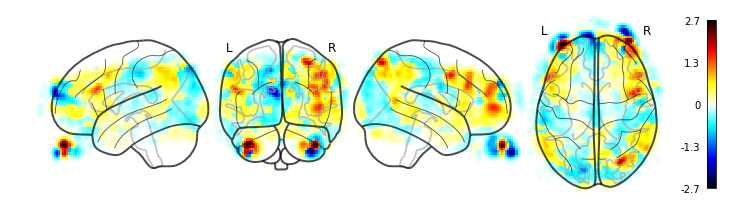

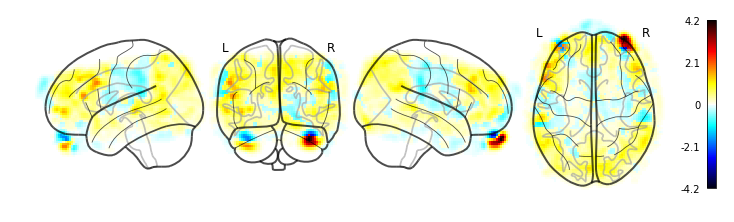

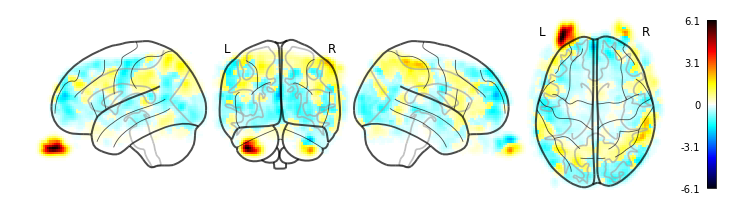

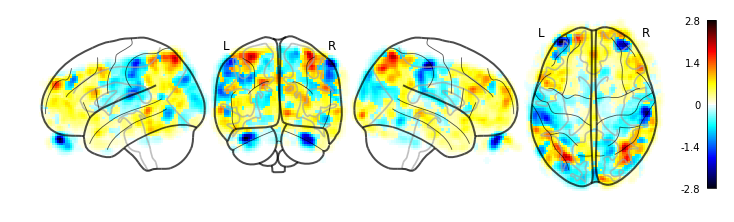

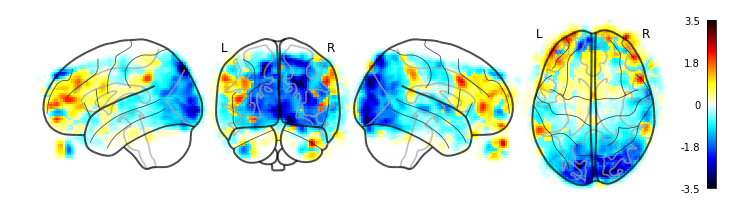

...

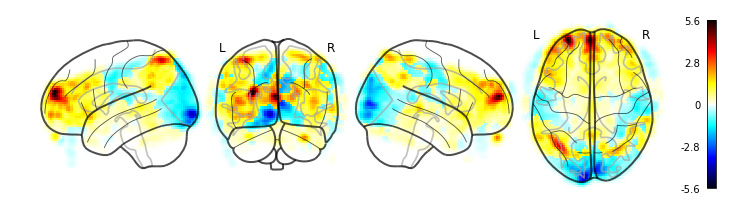

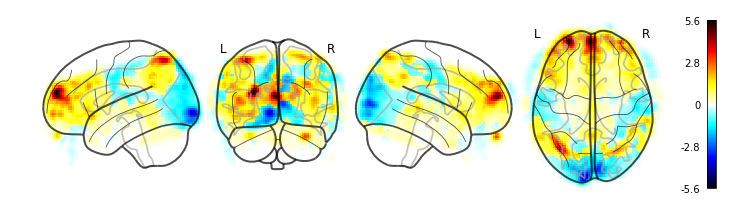

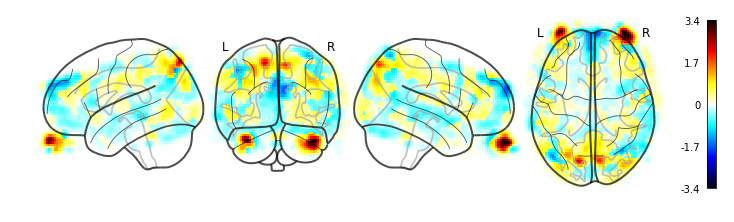

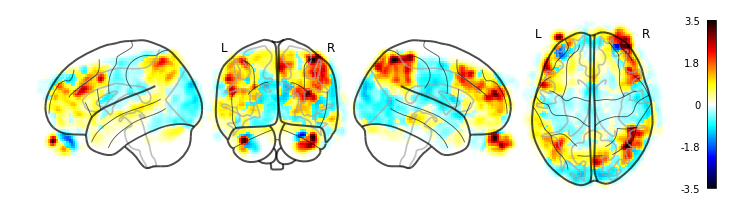

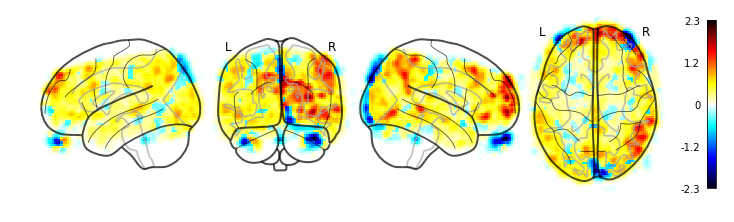

In [6]:
smooth_copes_AB = []
for k,v in copes_AB.items():
    smooth_cope = nilearn.image.smooth_img(v[3], 8)
    smooth_copes_AB.append(smooth_cope)
    nilearn.plotting.plot_glass_brain(smooth_cope,
                                      display_mode='lyrz', 
                                      colorbar=True, 
                                      plot_abs=False)

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/Users/dima/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


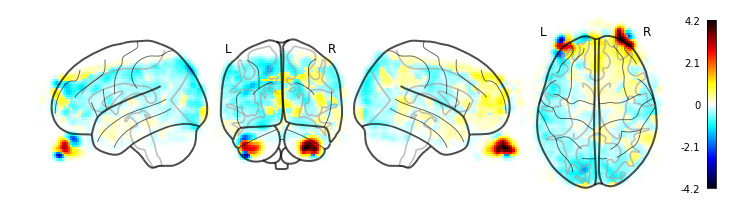

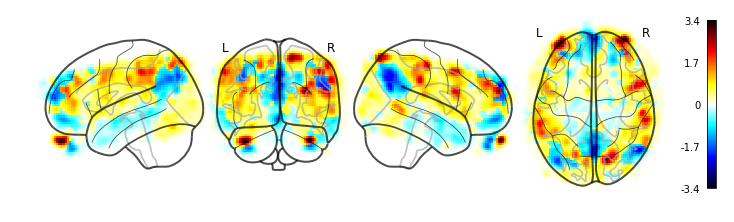

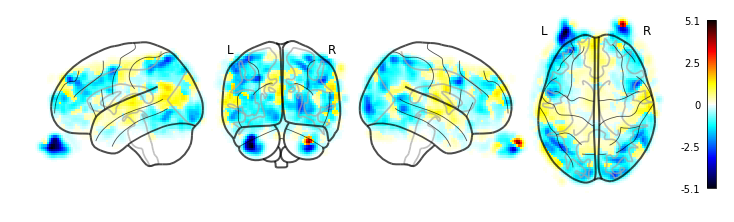

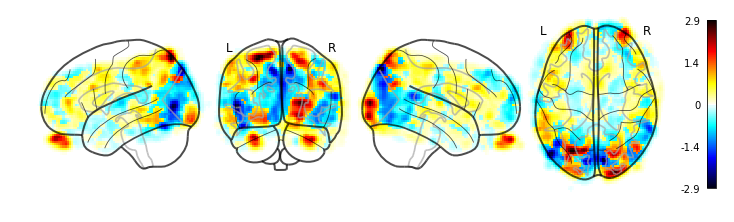

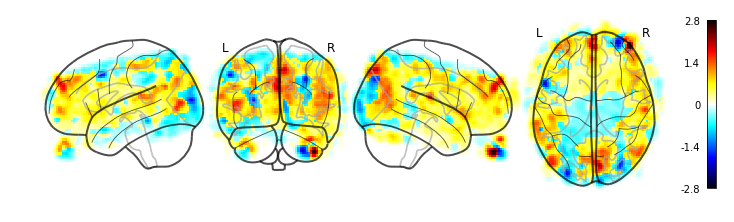

...

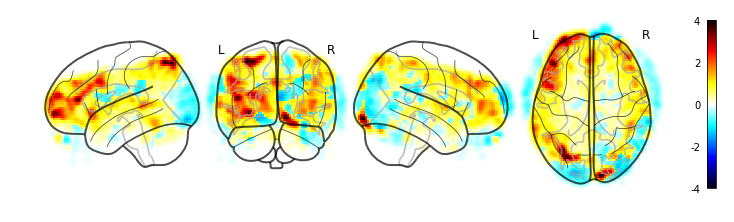

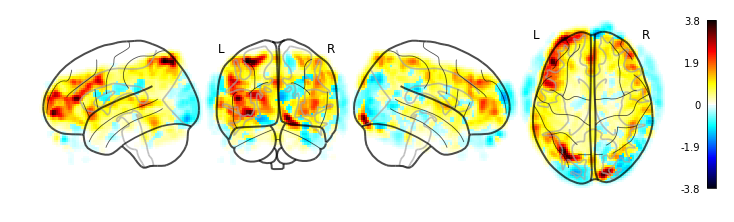

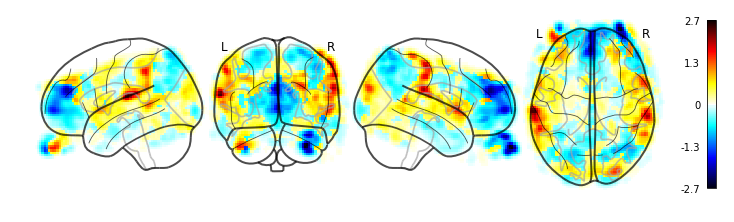

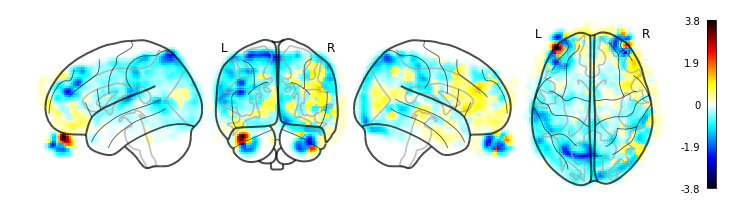

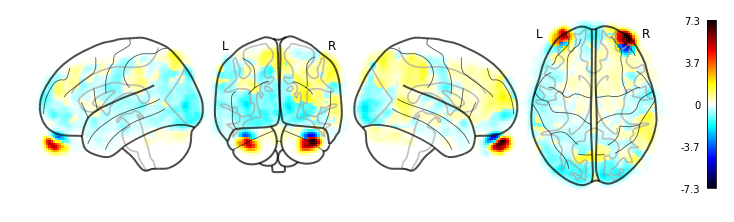

In [7]:
smooth_copes_CD = []
for k,v in copes_CD.items():
    smooth_cope = nilearn.image.smooth_img(v[3], 8)
    smooth_copes_CD.append(smooth_cope)
    nilearn.plotting.plot_glass_brain(smooth_cope,
                                      display_mode='lyrz', 
                                      colorbar=True, 
                                      plot_abs=False)

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/Users/dima/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


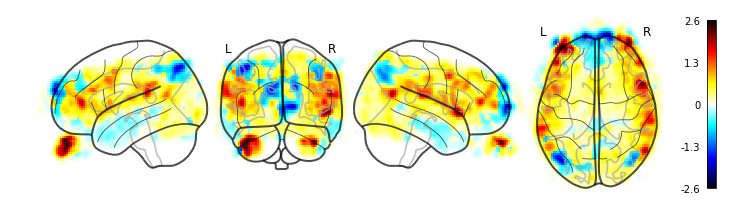

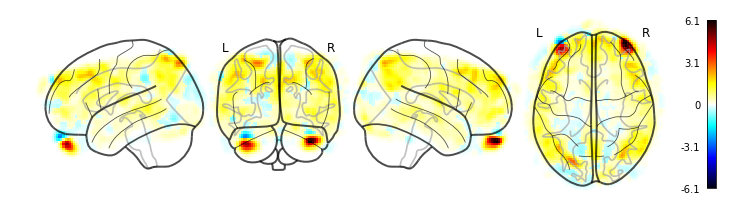

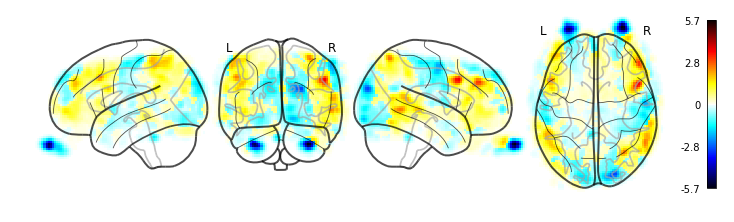

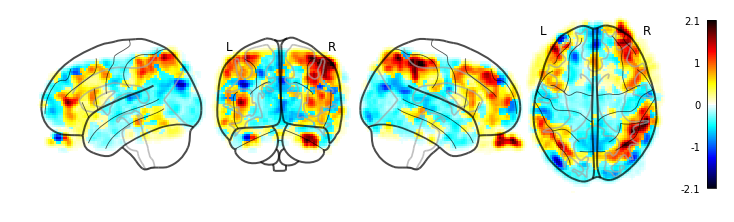

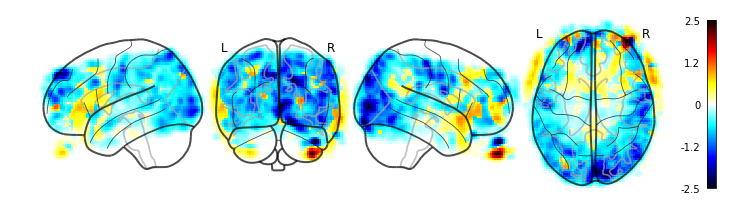

...

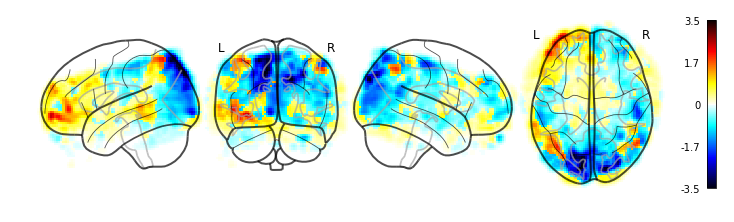

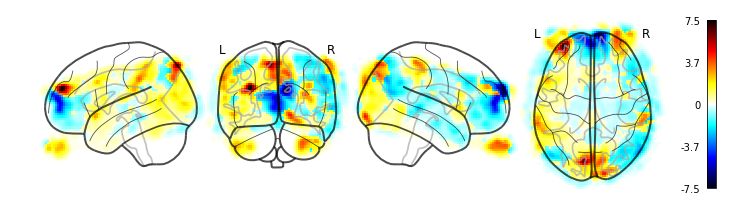

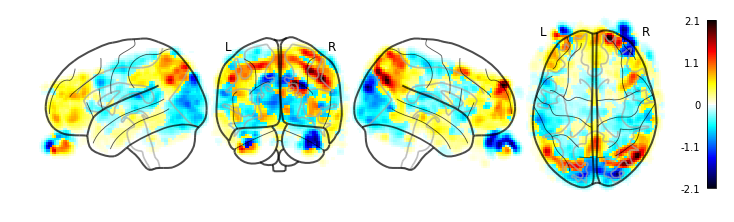

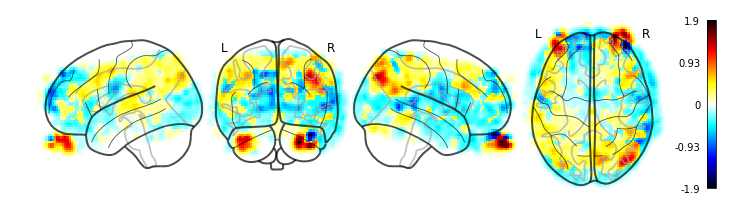

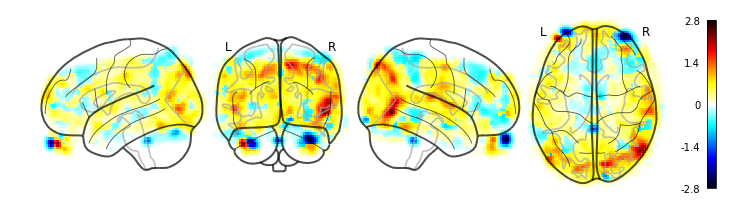

In [8]:
smooth_copes_ABCD = []
for k,v in copes_ABCD.items():
    smooth_cope = nilearn.image.smooth_img(v[3], 8)
    smooth_copes_ABCD.append(smooth_cope)
    nilearn.plotting.plot_glass_brain(smooth_cope,
                                      display_mode='lyrz', 
                                      colorbar=True, 
                                      plot_abs=False)

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


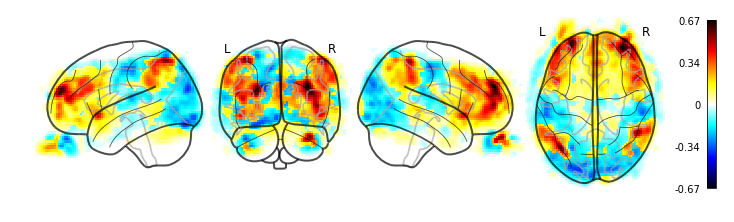

In [9]:
nilearn.plotting.plot_glass_brain(nilearn.image.mean_img(smooth_copes_AB),
                                  display_mode='lyrz', 
                                  colorbar=True, 
                                  plot_abs=False)

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


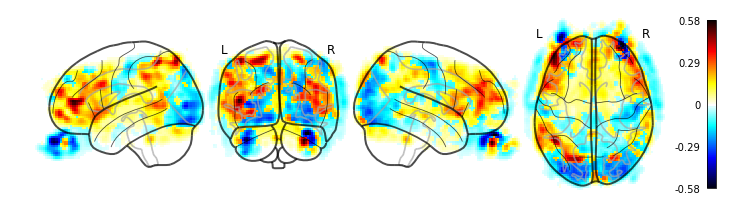

In [10]:
nilearn.plotting.plot_glass_brain(nilearn.image.mean_img(smooth_copes_CD),
                                  display_mode='lyrz', 
                                  colorbar=True, 
                                  plot_abs=False)

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


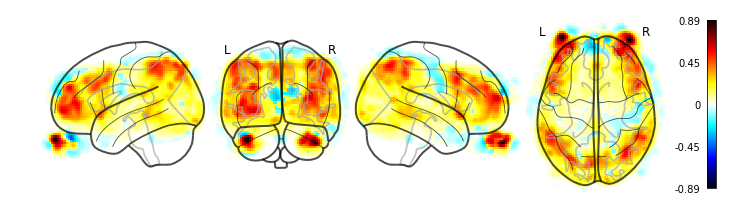

In [11]:
nilearn.plotting.plot_glass_brain(nilearn.image.mean_img(smooth_copes_ABCD),
                                  display_mode='lyrz', 
                                  colorbar=True, 
                                  plot_abs=False)

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/Users/dima/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


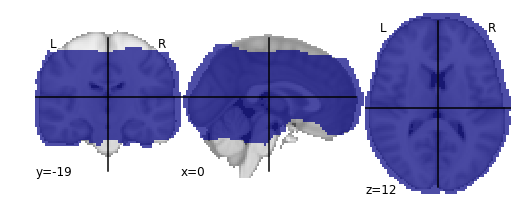

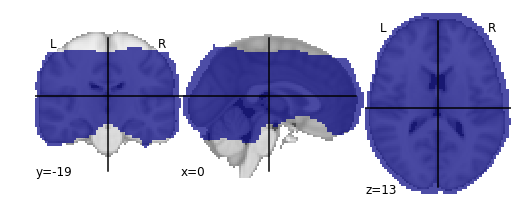

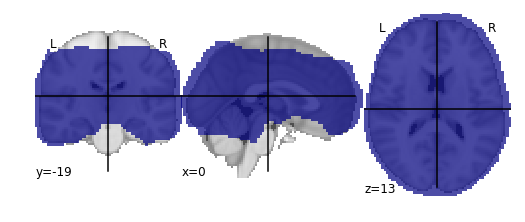

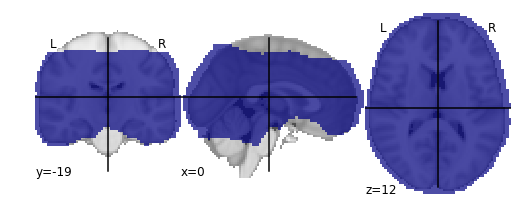

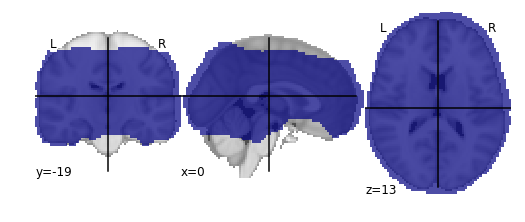

...

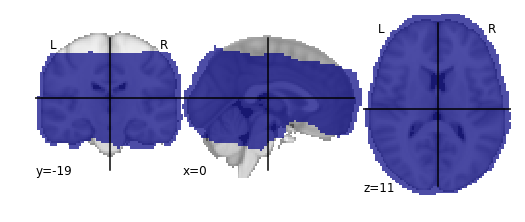

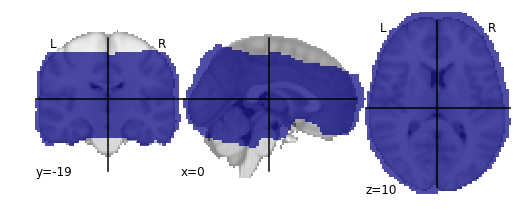

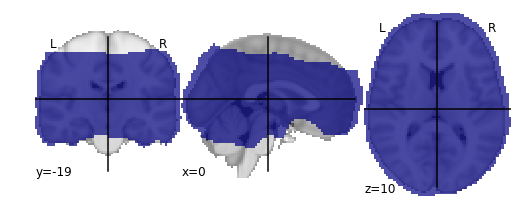

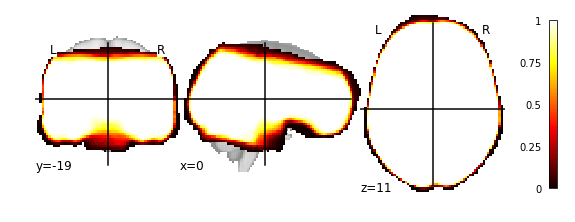

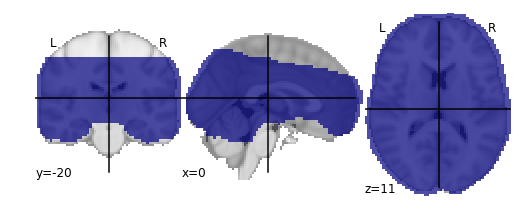

In [12]:
brainmasks = glob.glob(os.path.join(datadir, 
"derivatives", "fmriprep", "sub-*", "func", "*task-odormixture_*space-MNI152NLin2009cAsym*_brainmask.nii*"))

for mask in brainmasks:
    nilearn.plotting.plot_roi(mask)
    
mean_mask = nilearn.image.mean_img(brainmasks)
nilearn.plotting.plot_stat_map(mean_mask)
group_mask = nilearn.image.math_img("a>=0.95", a=mean_mask)
nilearn.plotting.plot_roi(group_mask)

In [13]:
!mkdir -p {datadir}/derivatives/custom_modelling_spm/

copes_ABCD_concat = nilearn.image.concat_imgs(smooth_copes_ABCD, auto_resample=True)
copes_ABCD_concat.to_filename(os.path.join(datadir, "derivatives", "custom_modelling_spm", "AB_plus_CD_copes_ABCD.nii.gz"))

group_mask = nilearn.image.resample_to_img(group_mask, copes_ABCD_concat, interpolation='nearest')
group_mask.to_filename(os.path.join(datadir, "derivatives", "custom_modelling_spm", "group_mask.nii.gz"))

In [14]:
randomise = mem.cache(fsl.Randomise)
randomise_results = randomise(in_file=os.path.join(datadir, "derivatives", "custom_modelling_spm", "AB_plus_CD_copes_ABCD.nii.gz"),
                              mask=os.path.join(datadir, "derivatives", "custom_modelling_spm", "group_mask.nii.gz"),
                              one_sample_group_mean=True,
                              tfce=True,
                              vox_p_values=True,
                              num_perm=500)
randomise_results.outputs


190208-19:12:09,574 nipype.workflow INFO:
	 [Node] Setting-up "5d2123d7ede3797ed0991c500261df6d" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-model-Randomise/5d2123d7ede3797ed0991c500261df6d".
190208-19:12:09,581 nipype.workflow INFO:
	 [Node] Running "5d2123d7ede3797ed0991c500261df6d" ("nipype.interfaces.fsl.model.Randomise"), a CommandLine Interface with command:
randomise -i /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/AB_plus_CD_copes_ABCD.nii.gz -o "randomise" -m /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/group_mask.nii.gz -n 500 -1 -T -x
190208-19:12:09,644 nipype.interface INFO:
	 stdout 2019-02-08T19:12:09.644274:randomise options: -i /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/AB_plus_CD_copes_ABCD.nii.gz -o randomise -m /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/group_mask.nii.gz -n 500 -1 -T -x 
190208-19:12:10,89 nipype.interface INFO:
	 s

190208-19:12:19,194 nipype.interface INFO:
	 stdout 2019-02-08T19:12:19.194173:Starting permutation 66
190208-19:12:19,290 nipype.interface INFO:
	 stdout 2019-02-08T19:12:19.290361:Starting permutation 67
190208-19:12:19,421 nipype.interface INFO:
	 stdout 2019-02-08T19:12:19.420968:Starting permutation 68
190208-19:12:19,686 nipype.interface INFO:
	 stdout 2019-02-08T19:12:19.685897:Starting permutation 69
190208-19:12:19,790 nipype.interface INFO:
	 stdout 2019-02-08T19:12:19.789912:Starting permutation 70
190208-19:12:19,903 nipype.interface INFO:
	 stdout 2019-02-08T19:12:19.903685:Starting permutation 71
190208-19:12:19,961 nipype.interface INFO:
	 stdout 2019-02-08T19:12:19.961747:Starting permutation 72
190208-19:12:20,119 nipype.interface INFO:
	 stdout 2019-02-08T19:12:20.119846:Starting permutation 73
190208-19:12:20,267 nipype.interface INFO:
	 stdout 2019-02-08T19:12:20.267808:Starting permutation 74
190208-19:12:20,473 nipype.interface INFO:
	 stdout 2019-02-08T19:12:20.4

190208-19:12:29,566 nipype.interface INFO:
	 stdout 2019-02-08T19:12:29.566205:Starting permutation 146
190208-19:12:29,706 nipype.interface INFO:
	 stdout 2019-02-08T19:12:29.706850:Starting permutation 147
190208-19:12:29,777 nipype.interface INFO:
	 stdout 2019-02-08T19:12:29.777880:Starting permutation 148
190208-19:12:29,865 nipype.interface INFO:
	 stdout 2019-02-08T19:12:29.864994:Starting permutation 149
190208-19:12:30,35 nipype.interface INFO:
	 stdout 2019-02-08T19:12:30.035813:Starting permutation 150
190208-19:12:30,182 nipype.interface INFO:
	 stdout 2019-02-08T19:12:30.181995:Starting permutation 151
190208-19:12:30,240 nipype.interface INFO:
	 stdout 2019-02-08T19:12:30.240620:Starting permutation 152
190208-19:12:30,321 nipype.interface INFO:
	 stdout 2019-02-08T19:12:30.321067:Starting permutation 153
190208-19:12:30,433 nipype.interface INFO:
	 stdout 2019-02-08T19:12:30.433141:Starting permutation 154
190208-19:12:30,527 nipype.interface INFO:
	 stdout 2019-02-08T19

190208-19:12:39,756 nipype.interface INFO:
	 stdout 2019-02-08T19:12:39.756228:Starting permutation 225
190208-19:12:39,866 nipype.interface INFO:
	 stdout 2019-02-08T19:12:39.866479:Starting permutation 226
190208-19:12:39,949 nipype.interface INFO:
	 stdout 2019-02-08T19:12:39.949093:Starting permutation 227
190208-19:12:40,43 nipype.interface INFO:
	 stdout 2019-02-08T19:12:40.043554:Starting permutation 228
190208-19:12:40,171 nipype.interface INFO:
	 stdout 2019-02-08T19:12:40.171230:Starting permutation 229
190208-19:12:40,414 nipype.interface INFO:
	 stdout 2019-02-08T19:12:40.414041:Starting permutation 230
190208-19:12:40,497 nipype.interface INFO:
	 stdout 2019-02-08T19:12:40.497751:Starting permutation 231
190208-19:12:40,614 nipype.interface INFO:
	 stdout 2019-02-08T19:12:40.614181:Starting permutation 232
190208-19:12:40,804 nipype.interface INFO:
	 stdout 2019-02-08T19:12:40.804013:Starting permutation 233
190208-19:12:41,32 nipype.interface INFO:
	 stdout 2019-02-08T19:

190208-19:12:50,581 nipype.interface INFO:
	 stdout 2019-02-08T19:12:50.581686:Starting permutation 304
190208-19:12:50,690 nipype.interface INFO:
	 stdout 2019-02-08T19:12:50.690064:Starting permutation 305
190208-19:12:50,846 nipype.interface INFO:
	 stdout 2019-02-08T19:12:50.845968:Starting permutation 306
190208-19:12:50,949 nipype.interface INFO:
	 stdout 2019-02-08T19:12:50.949744:Starting permutation 307
190208-19:12:51,78 nipype.interface INFO:
	 stdout 2019-02-08T19:12:51.078053:Starting permutation 308
190208-19:12:51,246 nipype.interface INFO:
	 stdout 2019-02-08T19:12:51.246674:Starting permutation 309
190208-19:12:51,321 nipype.interface INFO:
	 stdout 2019-02-08T19:12:51.321004:Starting permutation 310
190208-19:12:51,556 nipype.interface INFO:
	 stdout 2019-02-08T19:12:51.556497:Starting permutation 311
190208-19:12:51,677 nipype.interface INFO:
	 stdout 2019-02-08T19:12:51.677123:Starting permutation 312
190208-19:12:51,834 nipype.interface INFO:
	 stdout 2019-02-08T19

190208-19:13:01,373 nipype.interface INFO:
	 stdout 2019-02-08T19:13:01.373237:Starting permutation 383
190208-19:13:01,525 nipype.interface INFO:
	 stdout 2019-02-08T19:13:01.525450:Starting permutation 384
190208-19:13:01,708 nipype.interface INFO:
	 stdout 2019-02-08T19:13:01.708882:Starting permutation 385
190208-19:13:01,801 nipype.interface INFO:
	 stdout 2019-02-08T19:13:01.801306:Starting permutation 386
190208-19:13:01,943 nipype.interface INFO:
	 stdout 2019-02-08T19:13:01.943287:Starting permutation 387
190208-19:13:02,52 nipype.interface INFO:
	 stdout 2019-02-08T19:13:02.052091:Starting permutation 388
190208-19:13:02,110 nipype.interface INFO:
	 stdout 2019-02-08T19:13:02.110431:Starting permutation 389
190208-19:13:02,206 nipype.interface INFO:
	 stdout 2019-02-08T19:13:02.206135:Starting permutation 390
190208-19:13:02,371 nipype.interface INFO:
	 stdout 2019-02-08T19:13:02.371194:Starting permutation 391
190208-19:13:02,472 nipype.interface INFO:
	 stdout 2019-02-08T19

190208-19:13:11,150 nipype.interface INFO:
	 stdout 2019-02-08T19:13:11.150774:Starting permutation 462
190208-19:13:11,334 nipype.interface INFO:
	 stdout 2019-02-08T19:13:11.334639:Starting permutation 463
190208-19:13:11,518 nipype.interface INFO:
	 stdout 2019-02-08T19:13:11.518638:Starting permutation 464
190208-19:13:11,659 nipype.interface INFO:
	 stdout 2019-02-08T19:13:11.659144:Starting permutation 465
190208-19:13:11,848 nipype.interface INFO:
	 stdout 2019-02-08T19:13:11.848138:Starting permutation 466
190208-19:13:12,6 nipype.interface INFO:
	 stdout 2019-02-08T19:13:12.006835:Starting permutation 467
190208-19:13:12,88 nipype.interface INFO:
	 stdout 2019-02-08T19:13:12.088329:Starting permutation 468
190208-19:13:12,188 nipype.interface INFO:
	 stdout 2019-02-08T19:13:12.187992:Starting permutation 469
190208-19:13:12,276 nipype.interface INFO:
	 stdout 2019-02-08T19:13:12.276898:Starting permutation 470
190208-19:13:12,423 nipype.interface INFO:
	 stdout 2019-02-08T19:1

/Users/dima/anaconda3/lib/python3.7/site-packages/nipype/pipeline/engine/utils.py:307: DeprecationWarning: use "HasTraits.trait_set" instead
  result.outputs.set(**modify_paths(tosave, relative=True, basedir=cwd))



f_corrected_p_files = []
f_p_files = []
fstat_files = []
t_corrected_p_files = ['/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-model-Randomise/5d2123d7ede3797ed0991c500261df6d/randomise_tfce_corrp_tstat1.nii.gz']
t_p_files = []
tstat_files = ['/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-model-Randomise/5d2123d7ede3797ed0991c500261df6d/randomise_tstat1.nii.gz']

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


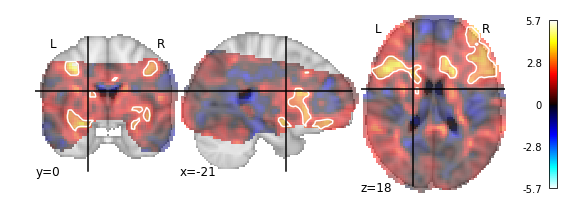

In [15]:
fig = nilearn.plotting.plot_stat_map(randomise_results.outputs.tstat_files[0], alpha=0.5, cut_coords=(-21, 0, 18))
fig.add_contours(randomise_results.outputs.t_corrected_p_files[0], levels=[0.95], colors='w')

In [16]:
!mkdir -p {datadir}/derivatives/custom_modelling_spm/

copes_AB_concat = nilearn.image.concat_imgs(smooth_copes_AB, auto_resample=True)
copes_AB_concat.to_filename(os.path.join(datadir, "derivatives", "custom_modelling_spm", "A_plus_B_copes_AB.nii.gz"))

group_mask = nilearn.image.resample_to_img(group_mask, copes_AB_concat, interpolation='nearest')
group_mask.to_filename(os.path.join(datadir, "derivatives", "custom_modelling_spm", "group_mask.nii.gz"))

In [17]:
randomise = mem.cache(fsl.Randomise)
randomise_results = randomise(in_file=os.path.join(datadir, "derivatives", "custom_modelling_spm", "A_plus_B_copes_AB.nii.gz"),
                              mask=os.path.join(datadir, "derivatives", "custom_modelling_spm", "group_mask.nii.gz"),
                              one_sample_group_mean=True,
                              tfce=True,
                              vox_p_values=True,
                              num_perm=500)
randomise_results.outputs


190208-19:13:20,367 nipype.workflow INFO:
	 [Node] Setting-up "9a24e9a5ff9f4e812d613b02ce302831" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-model-Randomise/9a24e9a5ff9f4e812d613b02ce302831".
190208-19:13:20,374 nipype.workflow INFO:
	 [Node] Running "9a24e9a5ff9f4e812d613b02ce302831" ("nipype.interfaces.fsl.model.Randomise"), a CommandLine Interface with command:
randomise -i /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/A_plus_B_copes_AB.nii.gz -o "randomise" -m /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/group_mask.nii.gz -n 500 -1 -T -x
190208-19:13:20,422 nipype.interface INFO:
	 stdout 2019-02-08T19:13:20.421993:randomise options: -i /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/A_plus_B_copes_AB.nii.gz -o randomise -m /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/group_mask.nii.gz -n 500 -1 -T -x 
190208-19:13:20,952 nipype.interface INFO:
	 stdout 2

190208-19:13:29,668 nipype.interface INFO:
	 stdout 2019-02-08T19:13:29.668025:Starting permutation 66
190208-19:13:29,773 nipype.interface INFO:
	 stdout 2019-02-08T19:13:29.773263:Starting permutation 67
190208-19:13:29,913 nipype.interface INFO:
	 stdout 2019-02-08T19:13:29.913096:Starting permutation 68
190208-19:13:30,12 nipype.interface INFO:
	 stdout 2019-02-08T19:13:30.011996:Starting permutation 69
190208-19:13:30,136 nipype.interface INFO:
	 stdout 2019-02-08T19:13:30.136131:Starting permutation 70
190208-19:13:30,226 nipype.interface INFO:
	 stdout 2019-02-08T19:13:30.226502:Starting permutation 71
190208-19:13:30,395 nipype.interface INFO:
	 stdout 2019-02-08T19:13:30.395819:Starting permutation 72
190208-19:13:30,500 nipype.interface INFO:
	 stdout 2019-02-08T19:13:30.500801:Starting permutation 73
190208-19:13:30,606 nipype.interface INFO:
	 stdout 2019-02-08T19:13:30.606066:Starting permutation 74
190208-19:13:30,715 nipype.interface INFO:
	 stdout 2019-02-08T19:13:30.71

190208-19:13:40,53 nipype.interface INFO:
	 stdout 2019-02-08T19:13:40.052954:Starting permutation 146
190208-19:13:40,220 nipype.interface INFO:
	 stdout 2019-02-08T19:13:40.220745:Starting permutation 147
190208-19:13:40,385 nipype.interface INFO:
	 stdout 2019-02-08T19:13:40.385686:Starting permutation 148
190208-19:13:40,514 nipype.interface INFO:
	 stdout 2019-02-08T19:13:40.514875:Starting permutation 149
190208-19:13:40,611 nipype.interface INFO:
	 stdout 2019-02-08T19:13:40.611110:Starting permutation 150
190208-19:13:40,714 nipype.interface INFO:
	 stdout 2019-02-08T19:13:40.714504:Starting permutation 151
190208-19:13:40,886 nipype.interface INFO:
	 stdout 2019-02-08T19:13:40.886447:Starting permutation 152
190208-19:13:41,91 nipype.interface INFO:
	 stdout 2019-02-08T19:13:41.091704:Starting permutation 153
190208-19:13:41,197 nipype.interface INFO:
	 stdout 2019-02-08T19:13:41.197504:Starting permutation 154
190208-19:13:41,328 nipype.interface INFO:
	 stdout 2019-02-08T19:

190208-19:13:50,86 nipype.interface INFO:
	 stdout 2019-02-08T19:13:50.086831:Starting permutation 225
190208-19:13:50,227 nipype.interface INFO:
	 stdout 2019-02-08T19:13:50.227563:Starting permutation 226
190208-19:13:50,377 nipype.interface INFO:
	 stdout 2019-02-08T19:13:50.376992:Starting permutation 227
190208-19:13:50,534 nipype.interface INFO:
	 stdout 2019-02-08T19:13:50.534366:Starting permutation 228
190208-19:13:50,669 nipype.interface INFO:
	 stdout 2019-02-08T19:13:50.669771:Starting permutation 229
190208-19:13:50,777 nipype.interface INFO:
	 stdout 2019-02-08T19:13:50.777729:Starting permutation 230
190208-19:13:50,917 nipype.interface INFO:
	 stdout 2019-02-08T19:13:50.917470:Starting permutation 231
190208-19:13:51,35 nipype.interface INFO:
	 stdout 2019-02-08T19:13:51.035075:Starting permutation 232
190208-19:13:51,162 nipype.interface INFO:
	 stdout 2019-02-08T19:13:51.162387:Starting permutation 233
190208-19:13:51,272 nipype.interface INFO:
	 stdout 2019-02-08T19:

190208-19:13:59,879 nipype.interface INFO:
	 stdout 2019-02-08T19:13:59.879521:Starting permutation 304
190208-19:13:59,989 nipype.interface INFO:
	 stdout 2019-02-08T19:13:59.989313:Starting permutation 305
190208-19:14:00,120 nipype.interface INFO:
	 stdout 2019-02-08T19:14:00.120305:Starting permutation 306
190208-19:14:00,290 nipype.interface INFO:
	 stdout 2019-02-08T19:14:00.290674:Starting permutation 307
190208-19:14:00,441 nipype.interface INFO:
	 stdout 2019-02-08T19:14:00.441784:Starting permutation 308
190208-19:14:00,578 nipype.interface INFO:
	 stdout 2019-02-08T19:14:00.578122:Starting permutation 309
190208-19:14:00,710 nipype.interface INFO:
	 stdout 2019-02-08T19:14:00.710073:Starting permutation 310
190208-19:14:00,804 nipype.interface INFO:
	 stdout 2019-02-08T19:14:00.804151:Starting permutation 311
190208-19:14:00,905 nipype.interface INFO:
	 stdout 2019-02-08T19:14:00.905781:Starting permutation 312
190208-19:14:01,3 nipype.interface INFO:
	 stdout 2019-02-08T19:

190208-19:14:10,130 nipype.interface INFO:
	 stdout 2019-02-08T19:14:10.130258:Starting permutation 383
190208-19:14:10,201 nipype.interface INFO:
	 stdout 2019-02-08T19:14:10.201247:Starting permutation 384
190208-19:14:10,306 nipype.interface INFO:
	 stdout 2019-02-08T19:14:10.306603:Starting permutation 385
190208-19:14:10,456 nipype.interface INFO:
	 stdout 2019-02-08T19:14:10.455901:Starting permutation 386
190208-19:14:10,567 nipype.interface INFO:
	 stdout 2019-02-08T19:14:10.567428:Starting permutation 387
190208-19:14:10,737 nipype.interface INFO:
	 stdout 2019-02-08T19:14:10.737887:Starting permutation 388
190208-19:14:10,870 nipype.interface INFO:
	 stdout 2019-02-08T19:14:10.870887:Starting permutation 389
190208-19:14:11,31 nipype.interface INFO:
	 stdout 2019-02-08T19:14:11.031810:Starting permutation 390
190208-19:14:11,105 nipype.interface INFO:
	 stdout 2019-02-08T19:14:11.105082:Starting permutation 391
190208-19:14:11,253 nipype.interface INFO:
	 stdout 2019-02-08T19

190208-19:14:20,38 nipype.interface INFO:
	 stdout 2019-02-08T19:14:20.038839:Starting permutation 462
190208-19:14:20,181 nipype.interface INFO:
	 stdout 2019-02-08T19:14:20.181071:Starting permutation 463
190208-19:14:20,273 nipype.interface INFO:
	 stdout 2019-02-08T19:14:20.273009:Starting permutation 464
190208-19:14:20,370 nipype.interface INFO:
	 stdout 2019-02-08T19:14:20.370713:Starting permutation 465
190208-19:14:20,478 nipype.interface INFO:
	 stdout 2019-02-08T19:14:20.478308:Starting permutation 466
190208-19:14:20,553 nipype.interface INFO:
	 stdout 2019-02-08T19:14:20.553222:Starting permutation 467
190208-19:14:20,711 nipype.interface INFO:
	 stdout 2019-02-08T19:14:20.711772:Starting permutation 468
190208-19:14:20,820 nipype.interface INFO:
	 stdout 2019-02-08T19:14:20.820227:Starting permutation 469
190208-19:14:20,956 nipype.interface INFO:
	 stdout 2019-02-08T19:14:20.956885:Starting permutation 470
190208-19:14:21,54 nipype.interface INFO:
	 stdout 2019-02-08T19:

/Users/dima/anaconda3/lib/python3.7/site-packages/nipype/pipeline/engine/utils.py:307: DeprecationWarning: use "HasTraits.trait_set" instead
  result.outputs.set(**modify_paths(tosave, relative=True, basedir=cwd))



f_corrected_p_files = []
f_p_files = []
fstat_files = []
t_corrected_p_files = ['/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-model-Randomise/9a24e9a5ff9f4e812d613b02ce302831/randomise_tfce_corrp_tstat1.nii.gz']
t_p_files = []
tstat_files = ['/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-model-Randomise/9a24e9a5ff9f4e812d613b02ce302831/randomise_tstat1.nii.gz']

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/Users/dima/anaconda3/lib/python3.7/site-packages/matplotlib/contour.py:1230: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


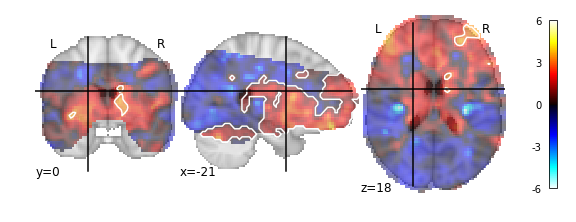

In [18]:
fig = nilearn.plotting.plot_stat_map(randomise_results.outputs.tstat_files[0], alpha=0.5, cut_coords=(-21, 0, 18))
fig.add_contours(randomise_results.outputs.t_corrected_p_files[0], levels=[0.95], colors='w')

In [19]:
!mkdir -p {datadir}/derivatives/custom_modelling_spm/

copes_CD_concat = nilearn.image.concat_imgs(smooth_copes_CD, auto_resample=True)
copes_CD_concat.to_filename(os.path.join(datadir, "derivatives", "custom_modelling_spm", "C_plus_D_copes_CD.nii.gz"))

group_mask = nilearn.image.resample_to_img(group_mask, copes_CD_concat, interpolation='nearest')
group_mask.to_filename(os.path.join(datadir, "derivatives", "custom_modelling_spm", "group_mask.nii.gz"))

In [20]:
randomise = mem.cache(fsl.Randomise)
randomise_results = randomise(in_file=os.path.join(datadir, "derivatives", "custom_modelling_spm", "C_plus_D_copes_CD.nii.gz"),
                              mask=os.path.join(datadir, "derivatives", "custom_modelling_spm", "group_mask.nii.gz"),
                              one_sample_group_mean=True,
                              tfce=True,
                              vox_p_values=True,
                              num_perm=500)
randomise_results.outputs


190208-19:14:28,394 nipype.workflow INFO:
	 [Node] Setting-up "0676326f77ef916cbac140f0b3d64c39" in "/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-model-Randomise/0676326f77ef916cbac140f0b3d64c39".
190208-19:14:28,401 nipype.workflow INFO:
	 [Node] Running "0676326f77ef916cbac140f0b3d64c39" ("nipype.interfaces.fsl.model.Randomise"), a CommandLine Interface with command:
randomise -i /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/C_plus_D_copes_CD.nii.gz -o "randomise" -m /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/group_mask.nii.gz -n 500 -1 -T -x
190208-19:14:28,461 nipype.interface INFO:
	 stdout 2019-02-08T19:14:28.460881:randomise options: -i /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/C_plus_D_copes_CD.nii.gz -o randomise -m /Users/dima/Desktop/odormixture/data/derivatives/custom_modelling_spm/group_mask.nii.gz -n 500 -1 -T -x 
190208-19:14:29,43 nipype.interface INFO:
	 stdout 20

190208-19:14:38,779 nipype.interface INFO:
	 stdout 2019-02-08T19:14:38.779271:Starting permutation 66
190208-19:14:38,895 nipype.interface INFO:
	 stdout 2019-02-08T19:14:38.895677:Starting permutation 67
190208-19:14:39,69 nipype.interface INFO:
	 stdout 2019-02-08T19:14:39.069203:Starting permutation 68
190208-19:14:39,268 nipype.interface INFO:
	 stdout 2019-02-08T19:14:39.268229:Starting permutation 69
190208-19:14:39,378 nipype.interface INFO:
	 stdout 2019-02-08T19:14:39.377965:Starting permutation 70
190208-19:14:39,465 nipype.interface INFO:
	 stdout 2019-02-08T19:14:39.465498:Starting permutation 71
190208-19:14:39,725 nipype.interface INFO:
	 stdout 2019-02-08T19:14:39.725058:Starting permutation 72
190208-19:14:39,854 nipype.interface INFO:
	 stdout 2019-02-08T19:14:39.853920:Starting permutation 73
190208-19:14:40,66 nipype.interface INFO:
	 stdout 2019-02-08T19:14:40.066173:Starting permutation 74
190208-19:14:40,213 nipype.interface INFO:
	 stdout 2019-02-08T19:14:40.213

190208-19:14:50,831 nipype.interface INFO:
	 stdout 2019-02-08T19:14:50.831021:Starting permutation 146
190208-19:14:51,74 nipype.interface INFO:
	 stdout 2019-02-08T19:14:51.074366:Starting permutation 147
190208-19:14:51,215 nipype.interface INFO:
	 stdout 2019-02-08T19:14:51.215276:Starting permutation 148
190208-19:14:51,329 nipype.interface INFO:
	 stdout 2019-02-08T19:14:51.329805:Starting permutation 149
190208-19:14:51,448 nipype.interface INFO:
	 stdout 2019-02-08T19:14:51.448172:Starting permutation 150
190208-19:14:51,603 nipype.interface INFO:
	 stdout 2019-02-08T19:14:51.603083:Starting permutation 151
190208-19:14:51,691 nipype.interface INFO:
	 stdout 2019-02-08T19:14:51.691184:Starting permutation 152
190208-19:14:51,965 nipype.interface INFO:
	 stdout 2019-02-08T19:14:51.965871:Starting permutation 153
190208-19:14:52,99 nipype.interface INFO:
	 stdout 2019-02-08T19:14:52.099891:Starting permutation 154
190208-19:14:52,310 nipype.interface INFO:
	 stdout 2019-02-08T19:

190208-19:15:02,412 nipype.interface INFO:
	 stdout 2019-02-08T19:15:02.411937:Starting permutation 225
190208-19:15:02,543 nipype.interface INFO:
	 stdout 2019-02-08T19:15:02.542930:Starting permutation 226
190208-19:15:02,657 nipype.interface INFO:
	 stdout 2019-02-08T19:15:02.657354:Starting permutation 227
190208-19:15:02,816 nipype.interface INFO:
	 stdout 2019-02-08T19:15:02.816120:Starting permutation 228
190208-19:15:02,969 nipype.interface INFO:
	 stdout 2019-02-08T19:15:02.969634:Starting permutation 229
190208-19:15:03,59 nipype.interface INFO:
	 stdout 2019-02-08T19:15:03.059386:Starting permutation 230
190208-19:15:03,232 nipype.interface INFO:
	 stdout 2019-02-08T19:15:03.232727:Starting permutation 231
190208-19:15:03,379 nipype.interface INFO:
	 stdout 2019-02-08T19:15:03.379301:Starting permutation 232
190208-19:15:03,460 nipype.interface INFO:
	 stdout 2019-02-08T19:15:03.460488:Starting permutation 233
190208-19:15:03,565 nipype.interface INFO:
	 stdout 2019-02-08T19

190208-19:15:13,192 nipype.interface INFO:
	 stdout 2019-02-08T19:15:13.192614:Starting permutation 304
190208-19:15:13,283 nipype.interface INFO:
	 stdout 2019-02-08T19:15:13.283425:Starting permutation 305
190208-19:15:13,470 nipype.interface INFO:
	 stdout 2019-02-08T19:15:13.470790:Starting permutation 306
190208-19:15:13,584 nipype.interface INFO:
	 stdout 2019-02-08T19:15:13.584377:Starting permutation 307
190208-19:15:13,759 nipype.interface INFO:
	 stdout 2019-02-08T19:15:13.759829:Starting permutation 308
190208-19:15:13,933 nipype.interface INFO:
	 stdout 2019-02-08T19:15:13.933573:Starting permutation 309
190208-19:15:14,54 nipype.interface INFO:
	 stdout 2019-02-08T19:15:14.053977:Starting permutation 310
190208-19:15:14,151 nipype.interface INFO:
	 stdout 2019-02-08T19:15:14.151758:Starting permutation 311
190208-19:15:14,302 nipype.interface INFO:
	 stdout 2019-02-08T19:15:14.302024:Starting permutation 312
190208-19:15:14,396 nipype.interface INFO:
	 stdout 2019-02-08T19

190208-19:15:24,911 nipype.interface INFO:
	 stdout 2019-02-08T19:15:24.911043:Starting permutation 383
190208-19:15:25,4 nipype.interface INFO:
	 stdout 2019-02-08T19:15:25.004221:Starting permutation 384
190208-19:15:25,97 nipype.interface INFO:
	 stdout 2019-02-08T19:15:25.096961:Starting permutation 385
190208-19:15:25,247 nipype.interface INFO:
	 stdout 2019-02-08T19:15:25.247133:Starting permutation 386
190208-19:15:25,395 nipype.interface INFO:
	 stdout 2019-02-08T19:15:25.395039:Starting permutation 387
190208-19:15:25,524 nipype.interface INFO:
	 stdout 2019-02-08T19:15:25.524276:Starting permutation 388
190208-19:15:25,718 nipype.interface INFO:
	 stdout 2019-02-08T19:15:25.718540:Starting permutation 389
190208-19:15:25,885 nipype.interface INFO:
	 stdout 2019-02-08T19:15:25.885914:Starting permutation 390
190208-19:15:26,39 nipype.interface INFO:
	 stdout 2019-02-08T19:15:26.038927:Starting permutation 391
190208-19:15:26,121 nipype.interface INFO:
	 stdout 2019-02-08T19:15

190208-19:15:36,579 nipype.interface INFO:
	 stdout 2019-02-08T19:15:36.579531:Starting permutation 462
190208-19:15:36,696 nipype.interface INFO:
	 stdout 2019-02-08T19:15:36.695926:Starting permutation 463
190208-19:15:36,769 nipype.interface INFO:
	 stdout 2019-02-08T19:15:36.769142:Starting permutation 464
190208-19:15:36,866 nipype.interface INFO:
	 stdout 2019-02-08T19:15:36.866342:Starting permutation 465
190208-19:15:37,22 nipype.interface INFO:
	 stdout 2019-02-08T19:15:37.021926:Starting permutation 466
190208-19:15:37,151 nipype.interface INFO:
	 stdout 2019-02-08T19:15:37.151641:Starting permutation 467
190208-19:15:37,255 nipype.interface INFO:
	 stdout 2019-02-08T19:15:37.254969:Starting permutation 468
190208-19:15:37,387 nipype.interface INFO:
	 stdout 2019-02-08T19:15:37.387263:Starting permutation 469
190208-19:15:37,495 nipype.interface INFO:
	 stdout 2019-02-08T19:15:37.495312:Starting permutation 470
190208-19:15:37,635 nipype.interface INFO:
	 stdout 2019-02-08T19

/Users/dima/anaconda3/lib/python3.7/site-packages/nipype/pipeline/engine/utils.py:307: DeprecationWarning: use "HasTraits.trait_set" instead
  result.outputs.set(**modify_paths(tosave, relative=True, basedir=cwd))



f_corrected_p_files = []
f_p_files = []
fstat_files = []
t_corrected_p_files = ['/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-model-Randomise/0676326f77ef916cbac140f0b3d64c39/randomise_tfce_corrp_tstat1.nii.gz']
t_p_files = []
tstat_files = ['/Users/dima/Desktop/odormixture/jupyter/nipype_mem/nipype-interfaces-fsl-model-Randomise/0676326f77ef916cbac140f0b3d64c39/randomise_tstat1.nii.gz']

/Users/dima/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/Users/dima/anaconda3/lib/python3.7/site-packages/matplotlib/contour.py:1230: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


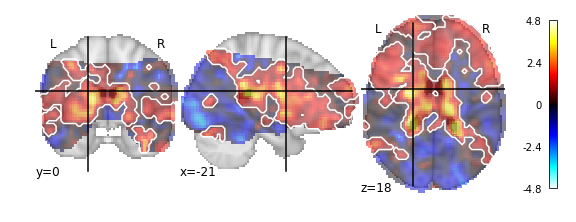

In [21]:
fig = nilearn.plotting.plot_stat_map(randomise_results.outputs.tstat_files[0], alpha=0.5, cut_coords=(-21, 0, 18))
fig.add_contours(randomise_results.outputs.t_corrected_p_files[0], levels=[0.95], colors='w')